In [2]:
import pandas as pd
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
import rasterio
import joblib
import pickle

from tqdm import tqdm
from skimage.filters import roberts, sobel, scharr, prewitt
from skimage.segmentation import felzenszwalb, quickshift, slic, watershed
from skimage import filters
from skimage.morphology import disk
from scipy import ndimage as nd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from yellowbrick.classifier import ROCAUC
from sklearn.metrics import confusion_matrix
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch


def image_to_df(snow_path, mask_path, print_gabor=False, labeled=True):
    #load in images
    img = cv2.imread(snow_path)
    if labeled:
        mask = rasterio.open(mask_path)
    
    #generate grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    #flatten image
    img2 = img.reshape((-1,3))

    #create dataframe
    df = pd.DataFrame(img2, columns=['Blue', 'Green', 'Red'])
    df['Gray'] = gray.reshape(-1)

    #gabor filter
    num = 1
    gabors = [5, 11, 23, 8, 6, 4]
    kernels = []
    for theta in range(2):
        theta = theta / 4. * np.pi
        for sigma in (1,3):
            for lamda in np.arange(0, np.pi, np.pi/4):
                for gamma in (.05, .5):
                    if num in gabors:
                        gabor_label = 'Gabor' + str(num)
                        ksize = 9
                        kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lamda, gamma, 0, ktype=cv2.CV_32F)
                        kernels.append(kernel)

                        fimg = cv2.filter2D(gray, cv2.CV_8UC3, kernel)
                        filtered_img = fimg.reshape(-1)
                        df[gabor_label] = filtered_img
                        if print_gabor:
                            print(gabor_label, ': theta=', theta, ': sigma=', sigma, ': lamda=', lamda, ': gamma=', gamma)
                    num += 1

    #Roberts Edge
    roberts_edge = roberts(gray).reshape(-1)
    df['Roberts'] = roberts_edge

    #Sobel Edge
    sobel_edge = sobel(gray).reshape(-1)
    df['Sobel'] = sobel_edge

    #Scharr Edge
    scharr_edge = scharr(gray).reshape(-1)
    df['Scharr'] = scharr_edge

    #Prewitt Edge
    prewitt_edge = prewitt(gray).reshape(-1)
    df['Prewitt'] = prewitt_edge

    gaussian_img = nd.gaussian_filter(gray, sigma=3).reshape(-1)
    df['Gaussian s3'] = gaussian_img

    gaussian_img2 = nd.gaussian_filter(gray, sigma=7).reshape(-1)
    df['Gaussian s7'] = gaussian_img2

    median_img =  nd.median_filter(gray, size=3).reshape(-1)
    df['Median s3'] = median_img

    #segmentation
    #felzenszwalb
    segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=50)
    df['Felzenszwalb'] = segments_fz.reshape(-1)

    #quickshift
    segments_quick = quickshift(img, kernel_size=3, max_dist=6, ratio=0.5)
    df['Quickshift'] = segments_quick.reshape(-1)

    #slic
    segments_slic = slic(img, n_segments=250, compactness=10, sigma=1)
    df['SLIC'] = segments_slic.reshape(-1)

    #watershed
    gradient = filters.rank.gradient(gray, disk(2))
    segments_ws = watershed(gradient, markers=250, compactness=0.001)
    df['Watershed'] = segments_ws.reshape(-1)

    #labels
    if labeled:
        df['labels'] = mask.read(1).reshape(-1)

    return df

def visualize(img, mask, pred_image, accuracy = None, confusion_matrix = None, location=None, date=None):
    fig, axs = plt.subplots(2, 2, figsize=(15, 10))

    # Display original image
    axs[0, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[0, 0].set_title('Original Image')
    axs[0, 0].axis('off')

    # Display mask
    axs[0, 1].imshow(mask.read(1), cmap='gray')
    axs[0, 1].set_title('Mask')
    axs[0, 1].axis('off')

    # Display predicted image
    axs[1, 0].imshow(pred_image, cmap='gray')
    axs[1, 0].set_title('Predicted Image')
    axs[1, 0].axis('off')

    # Display confusion matrix as table (if provided)
    if confusion_matrix is not None:
        axs[1, 1].axis('tight')
        axs[1, 1].axis('off')

        #change everything to percents
        confusion_matrix = confusion_matrix.astype('float') / confusion_matrix.sum(axis=1)[:, np.newaxis]

        #multiply by 100 and round to 4 decimal places, then convert to strings and add % sign
        confusion_matrix = np.round(confusion_matrix * 100, 3).astype(str)
        confusion_matrix = np.char.add(confusion_matrix, '%')
        
        # Create the table
        table_data = [[''] + [f'Pred {i}' for i in range(confusion_matrix.shape[1])]]  # Header row
        for i in range(confusion_matrix.shape[0]):
            row = [f'True {i}'] + list(confusion_matrix[i])
            table_data.append(row)
        
        # Add the table to the subplot
        table = axs[1, 1].table(cellText=table_data, loc='center', cellLoc='center')
        table.auto_set_font_size(False)
        table.set_fontsize(12)
        table.scale(1.2, 1.2)
        table.auto_set_column_width([0,1])
        axs[1, 1].set_title('Confusion Matrix')
        
        # Add accuracy text near the confusion matrix
        if accuracy is not None:
            axs[1, 1].text(0.5, -0.1, f'Accuracy: {accuracy}', horizontalalignment='center', verticalalignment='center', fontsize=12, transform=axs[1, 1].transAxes)
    else:
        true_positives = np.logical_and(mask.read(1) == 1,  pred_image == 1)
        false_positives = np.logical_and(mask.read(1) == 0, pred_image == 1)
        true_negatives = np.logical_and(mask.read(1) == 0, pred_image == 0)
        false_negatives = np.logical_and(mask.read(1) == 1, pred_image == 0)

        differences = np.zeros_like(mask.read(1))
        differences[true_positives] = 0
        differences[false_positives] = 1
        differences[true_negatives] = 2
        differences[false_negatives] = 3

        colors = ['white', 'blue', 'black', 'red']
        cmap = ListedColormap(colors)
        classes = ['True Positive', 'False Positive', 'True Negative', 'False Negative']
        legend_handles = [Patch(color=colors[i], label=classes[i]) for i in range(4)]

        axs[1, 1].imshow(differences, cmap=cmap)
        axs[1,1].axis('off')
        plt.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
        
    
    #create title string with location, date, and accuracy
    title = ""
    if location is not None:
        title += f'Location: {location}\n'
    if date is not None:
        # replace _ with -
        date = date.replace('_', '-')
        title += f'Date: {date}\n'
    if accuracy is not None:
        accuracy_percent = accuracy*100
        title += f'Accuracy: {accuracy_percent:.2f}%\n'
    plt.suptitle(title)

    plt.tight_layout()
    plt.show()

In [3]:
# load in data
csv_df = pd.read_csv('data/640/640.csv')

# load in model
with open('RF/Best_Model/results/best_model.pkl', 'rb') as f:
    model = pickle.load(f)

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


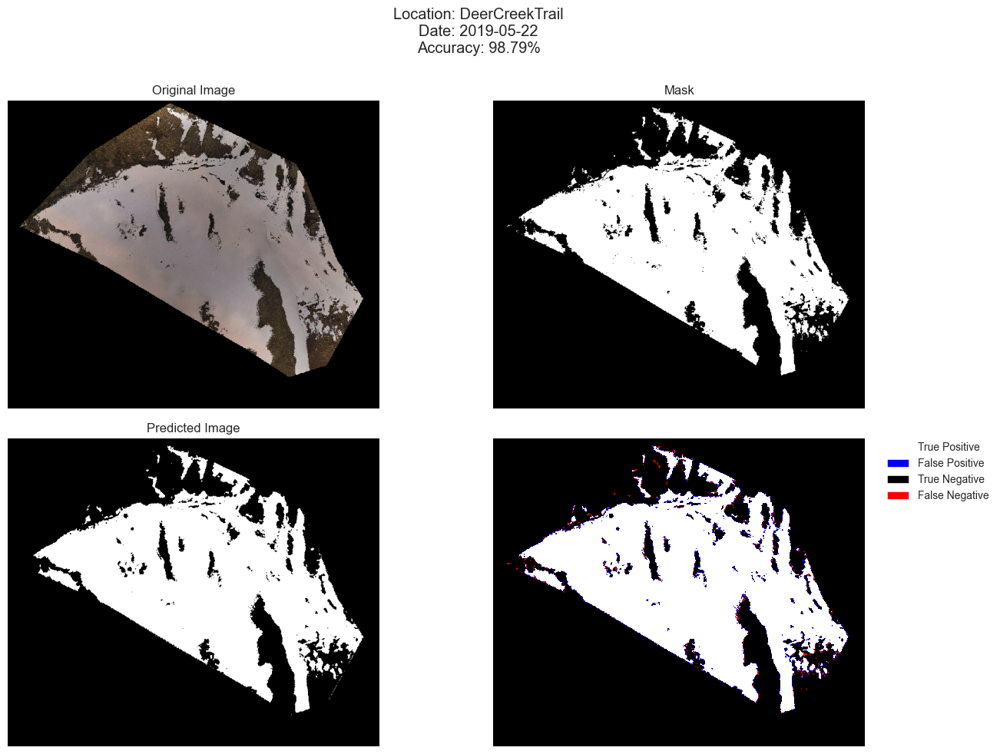

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


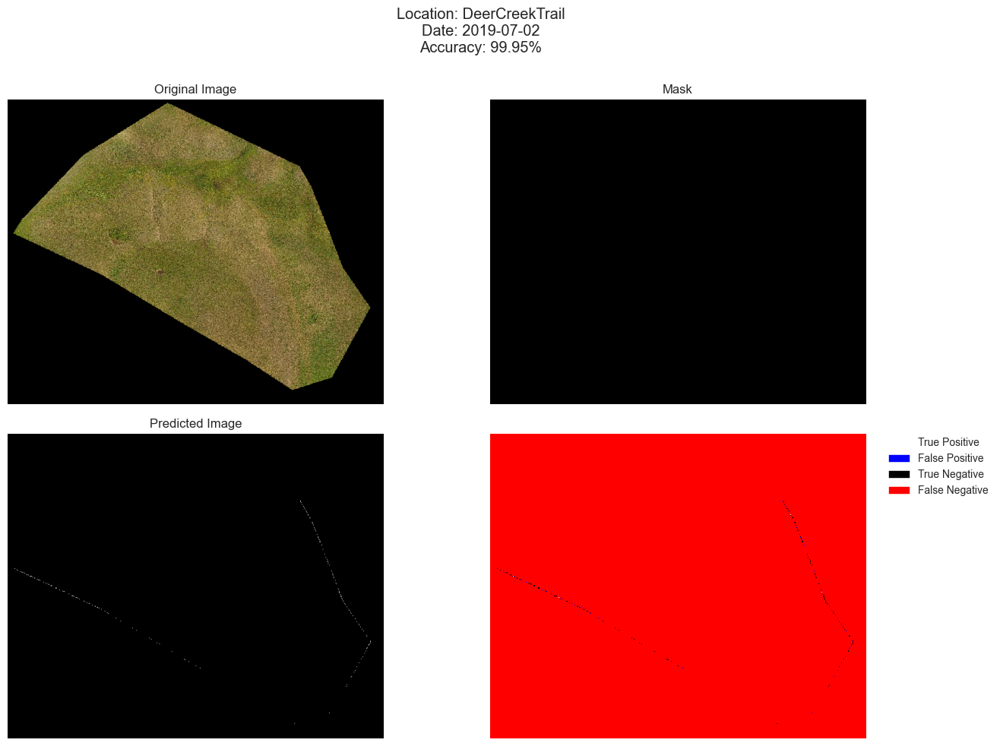

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.0s finished


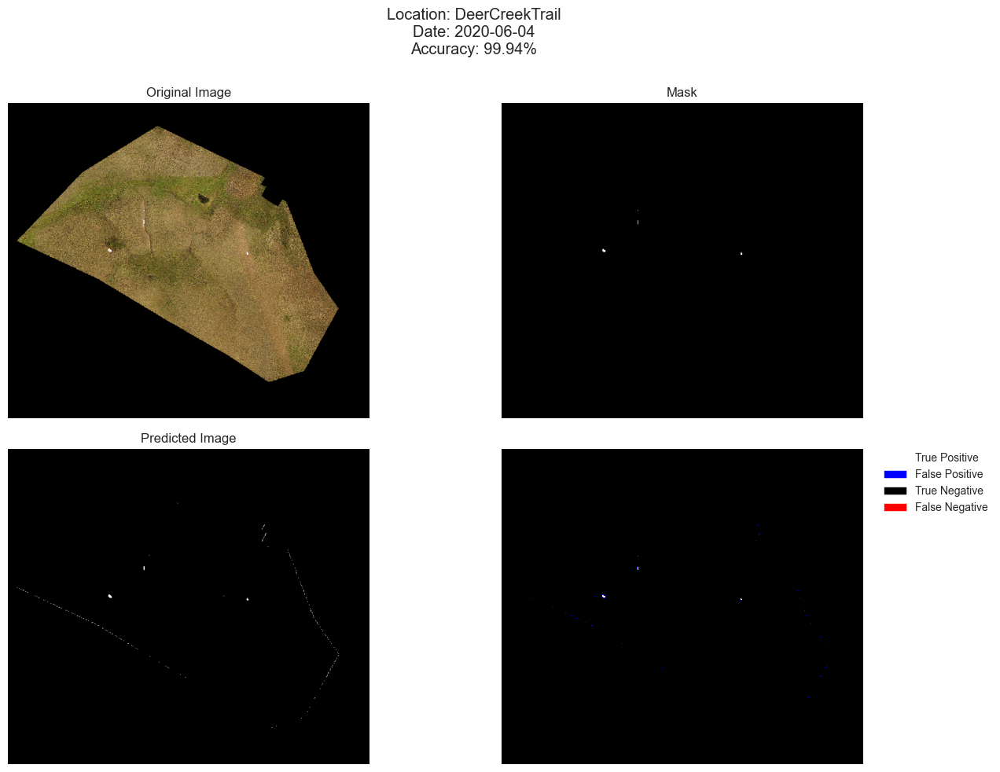

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


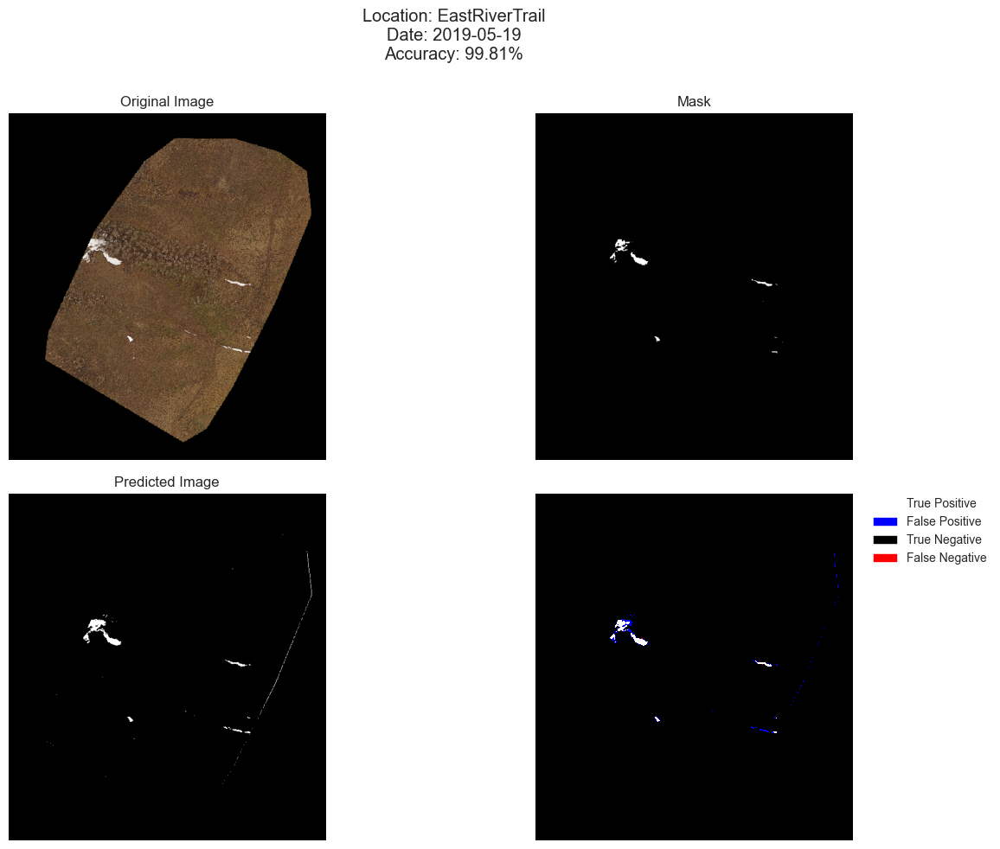

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


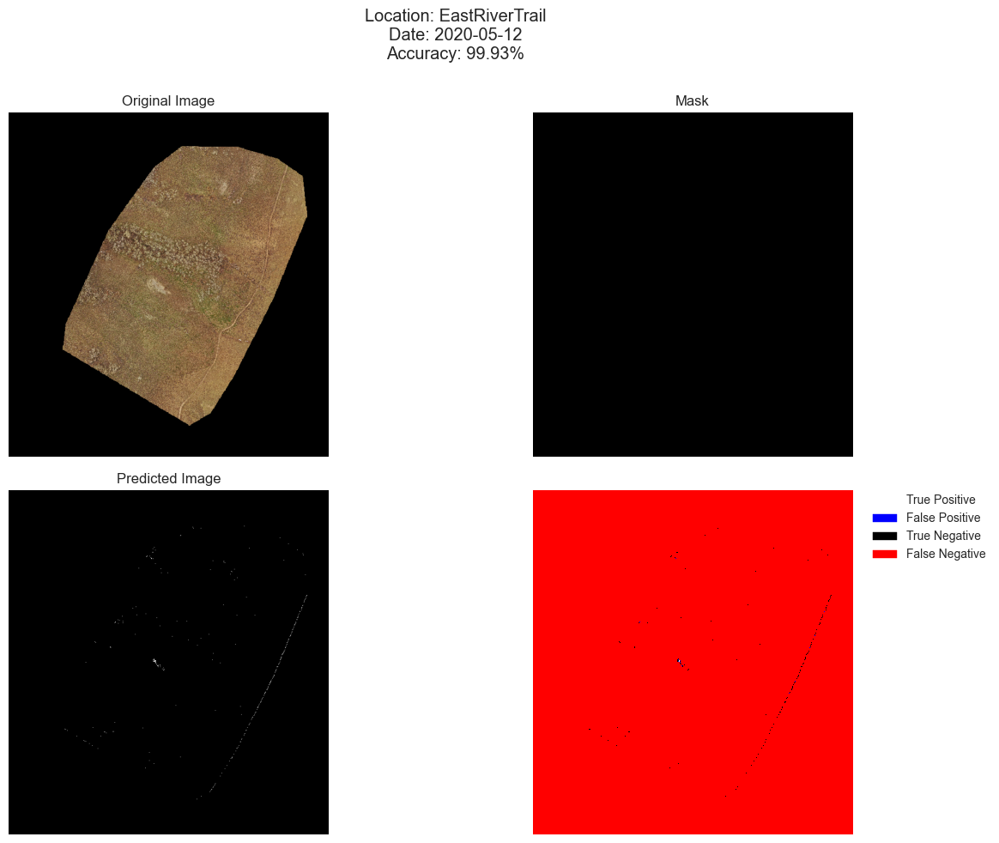

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


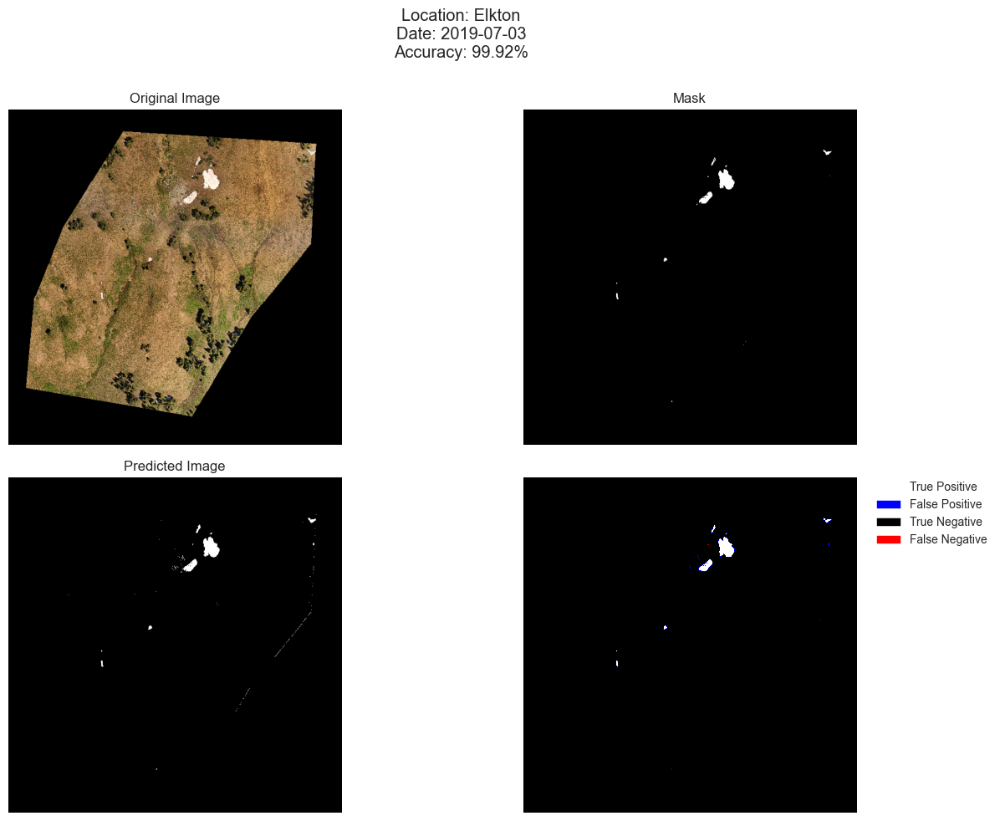

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


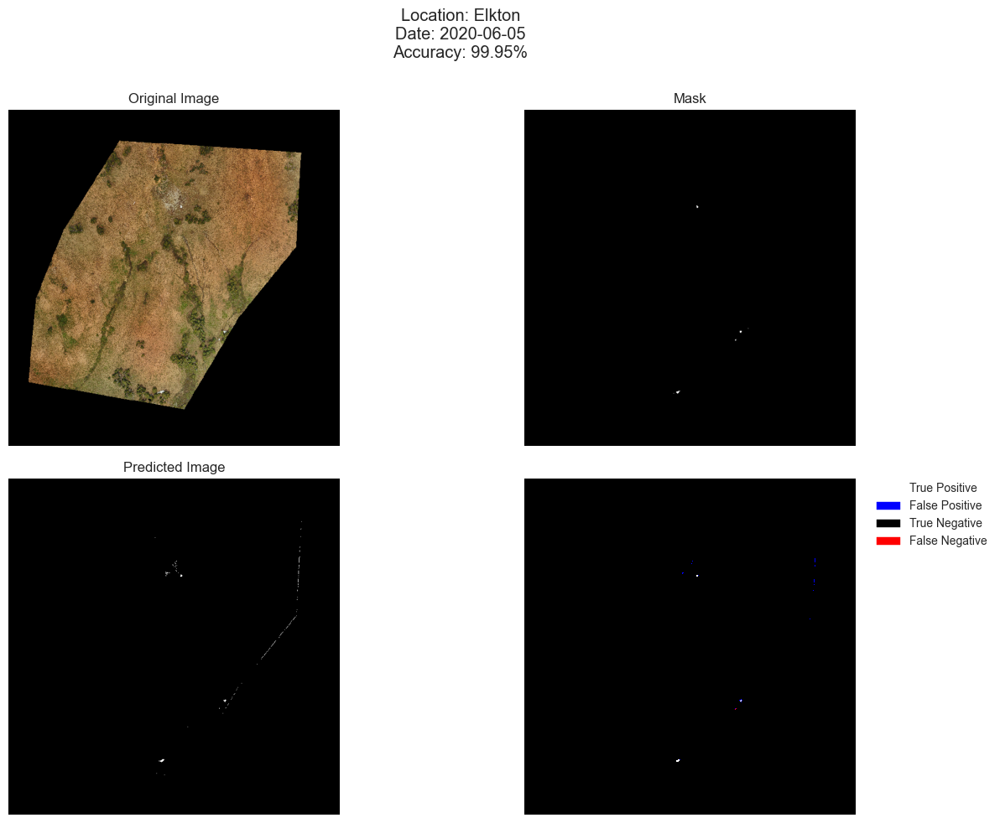

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.0s finished


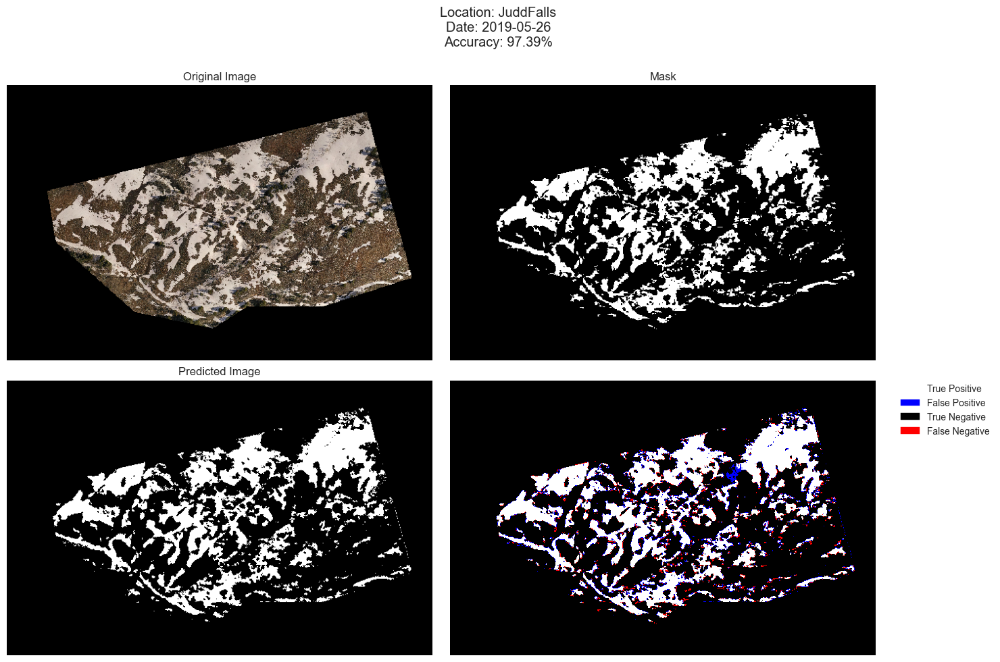

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.0s finished


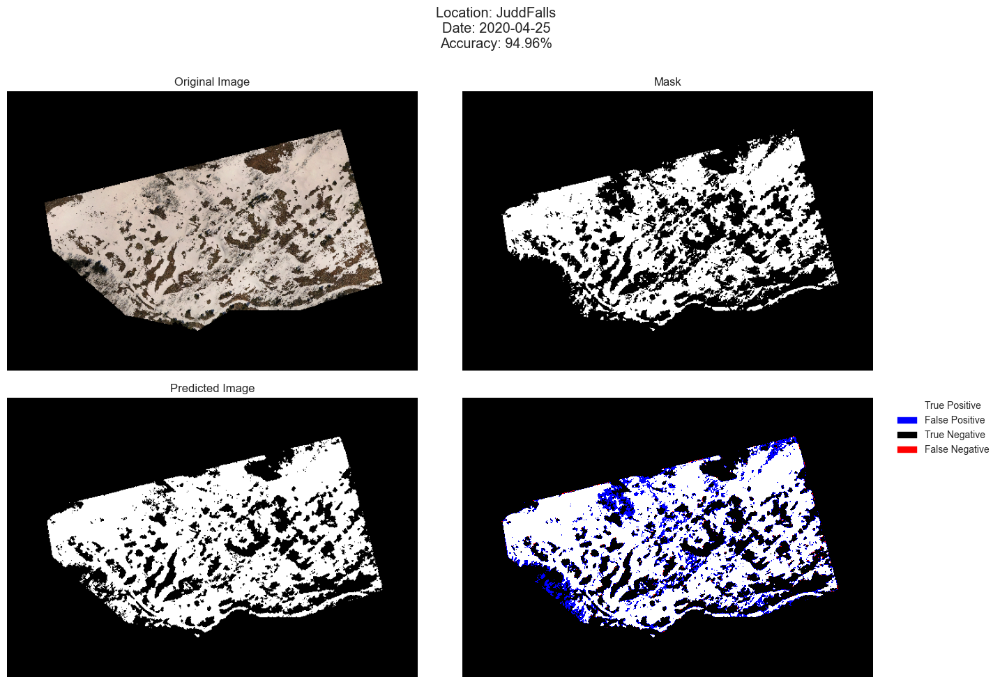

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.0s finished


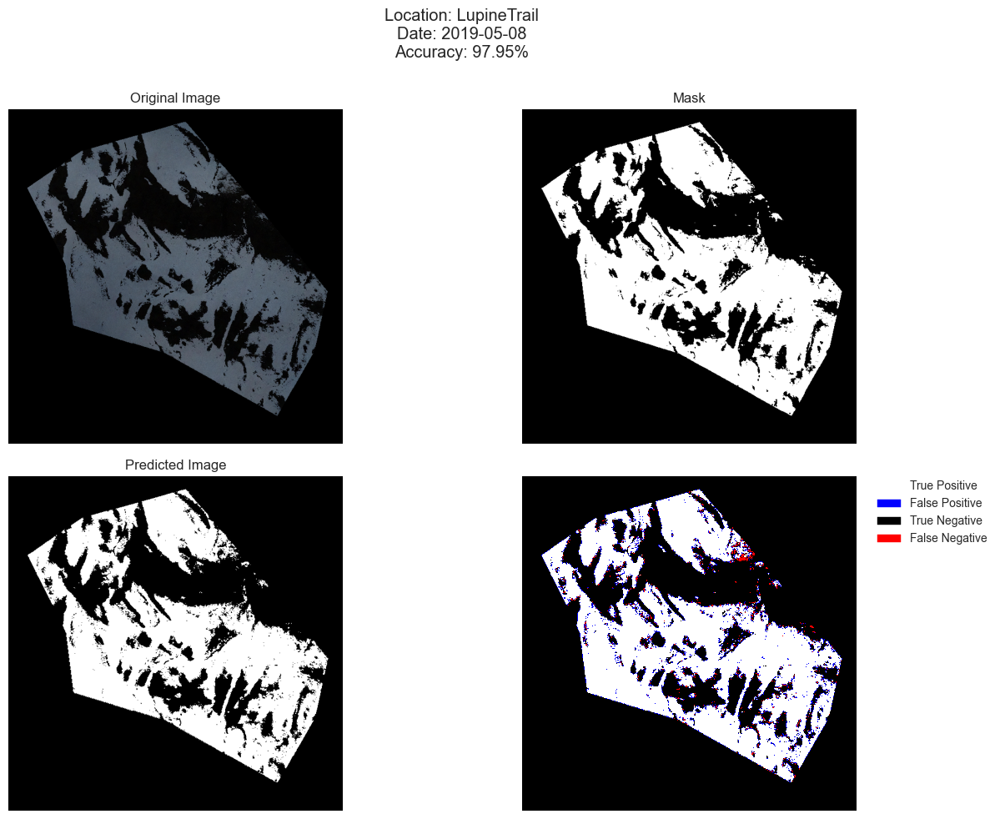

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


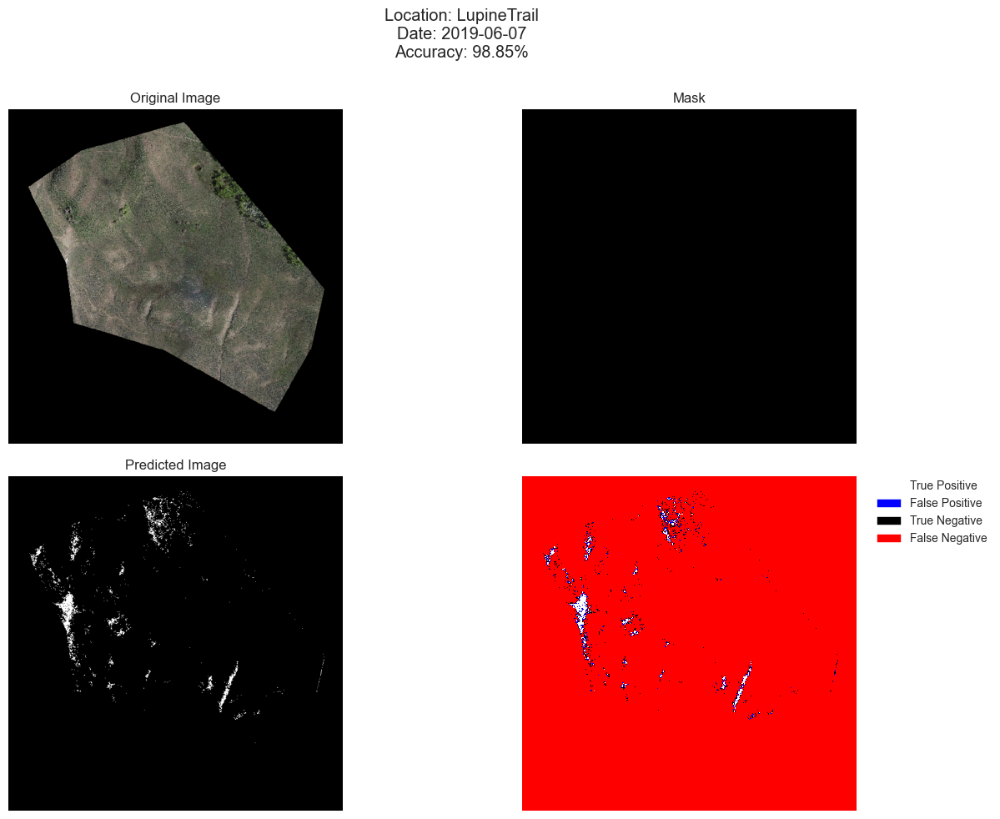

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.0s finished


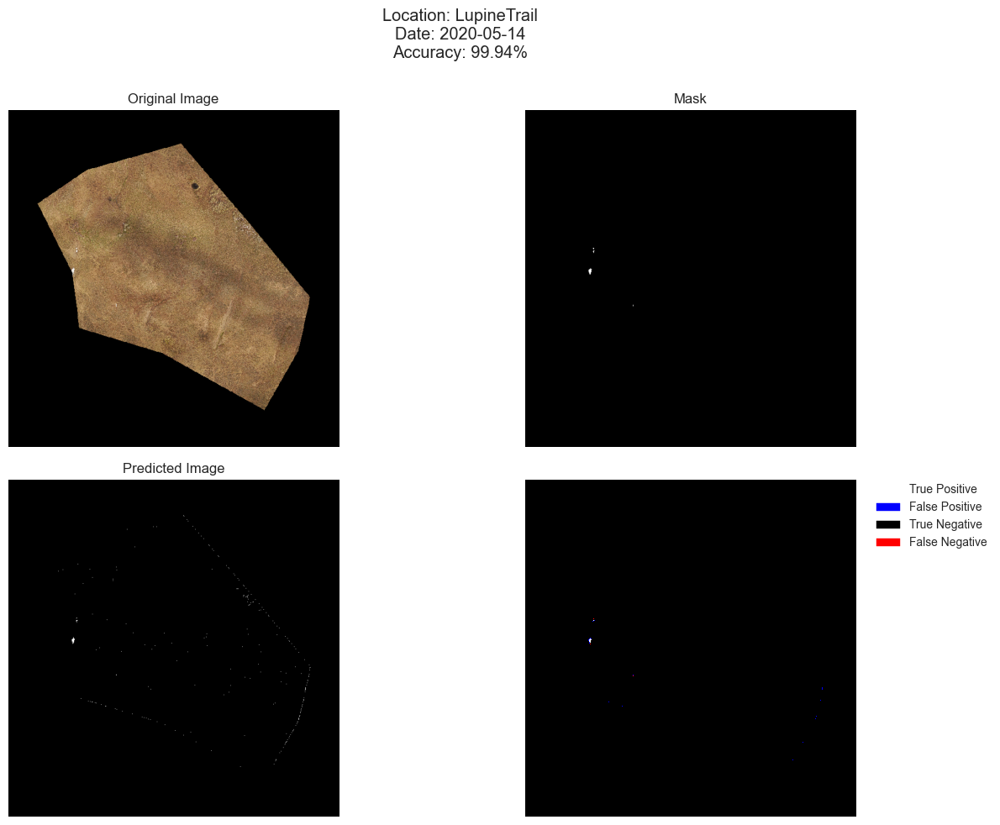

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


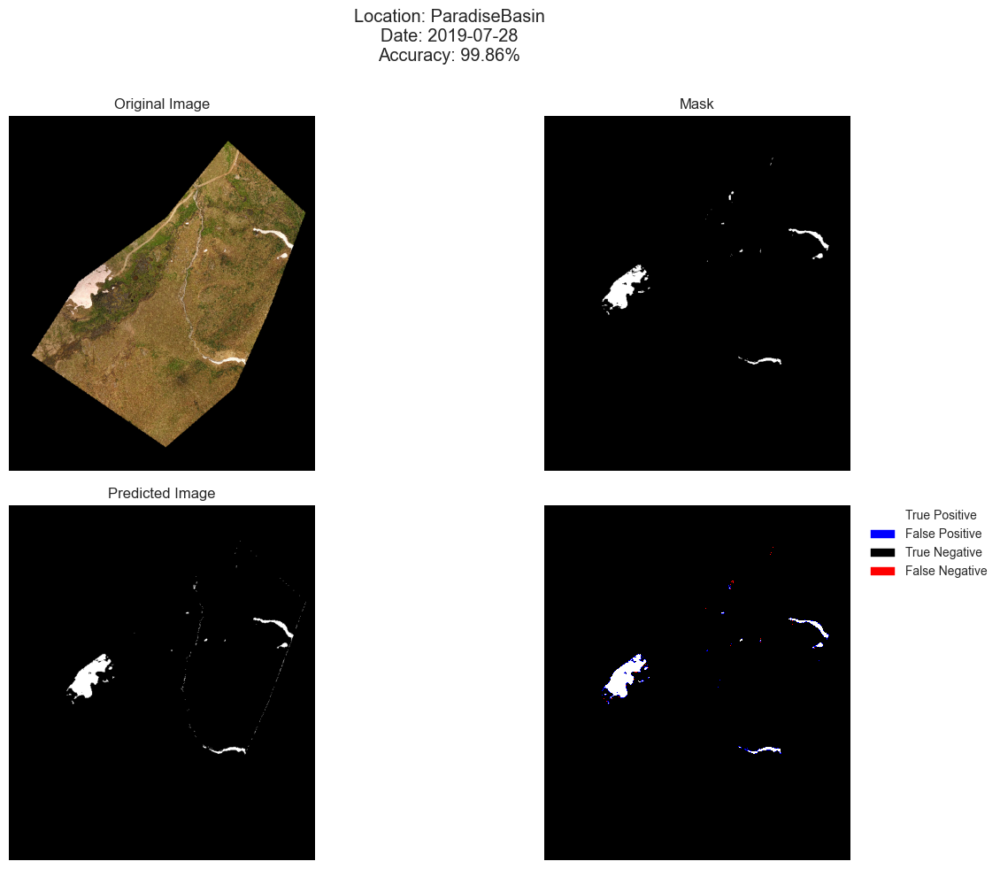

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


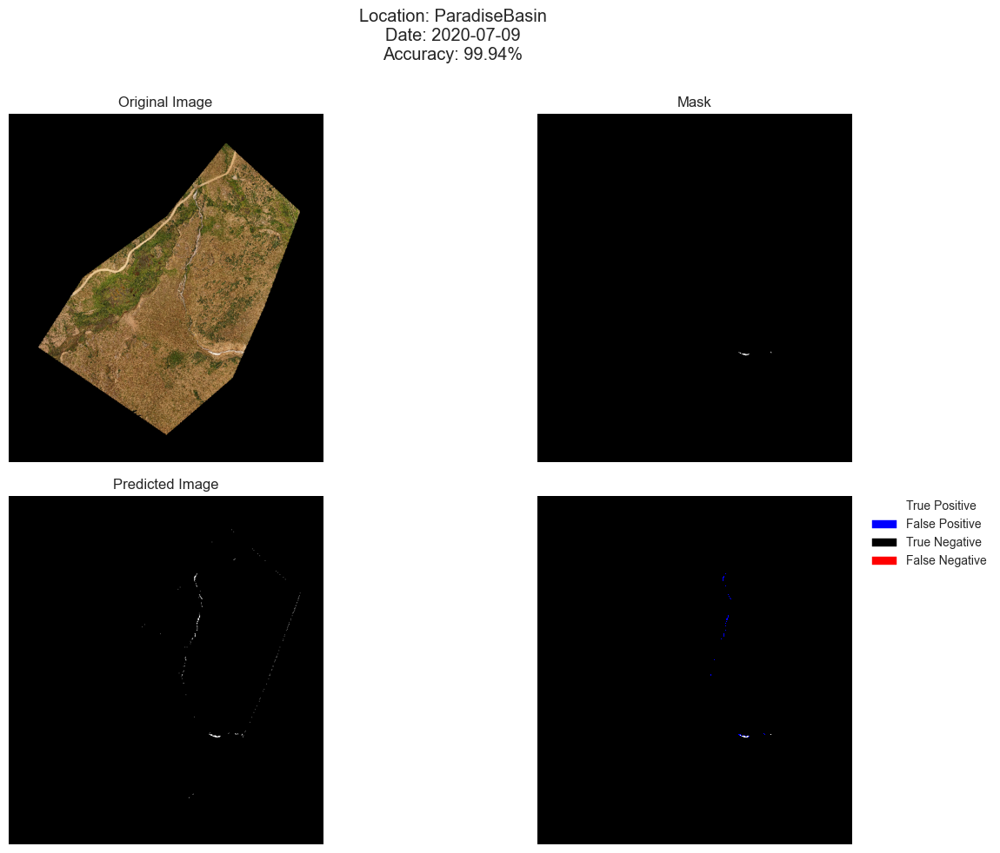

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


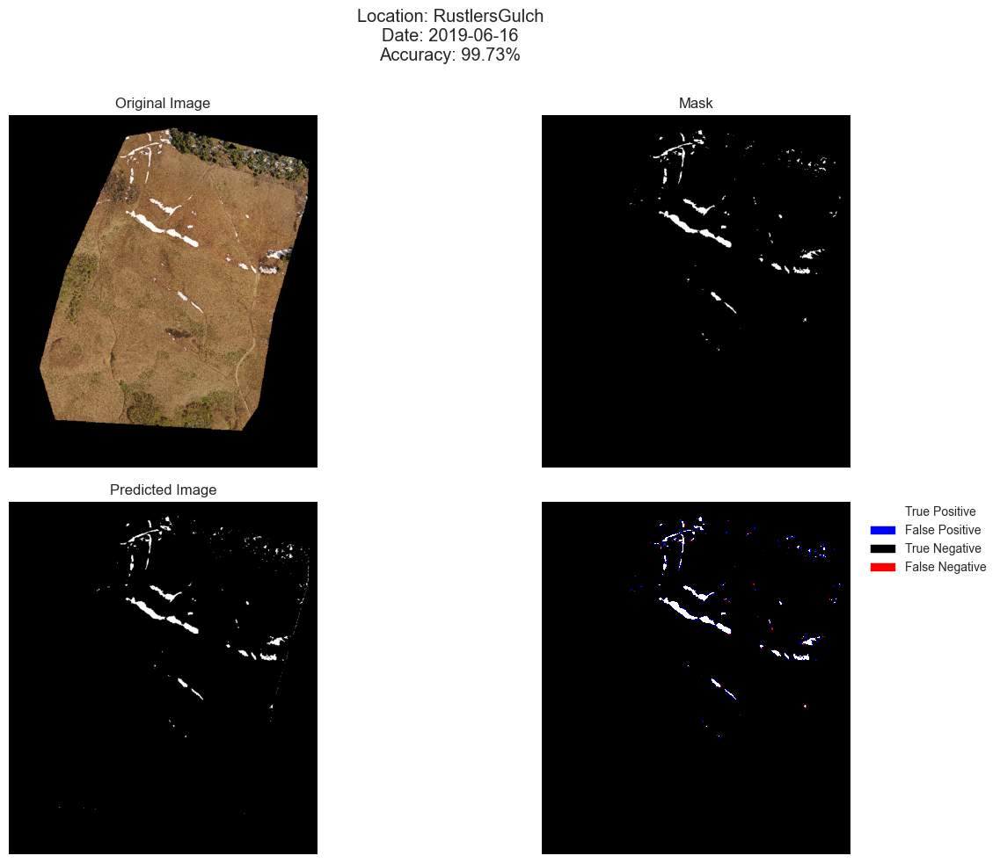

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


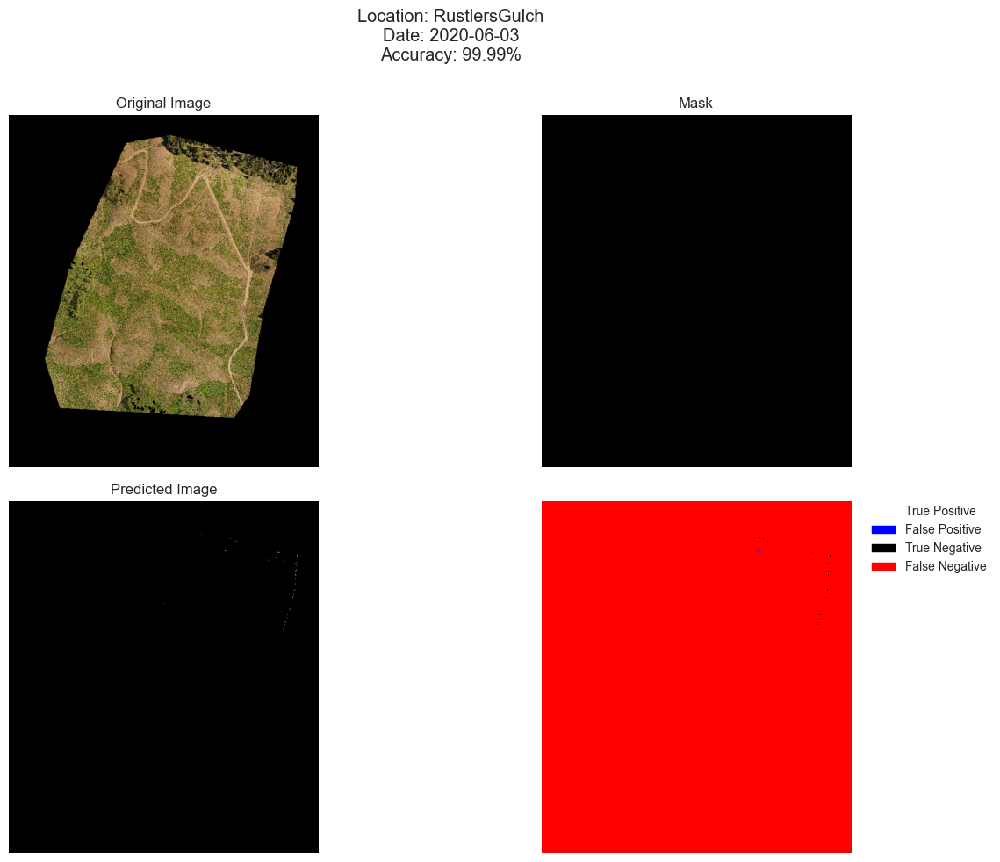

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.0s finished


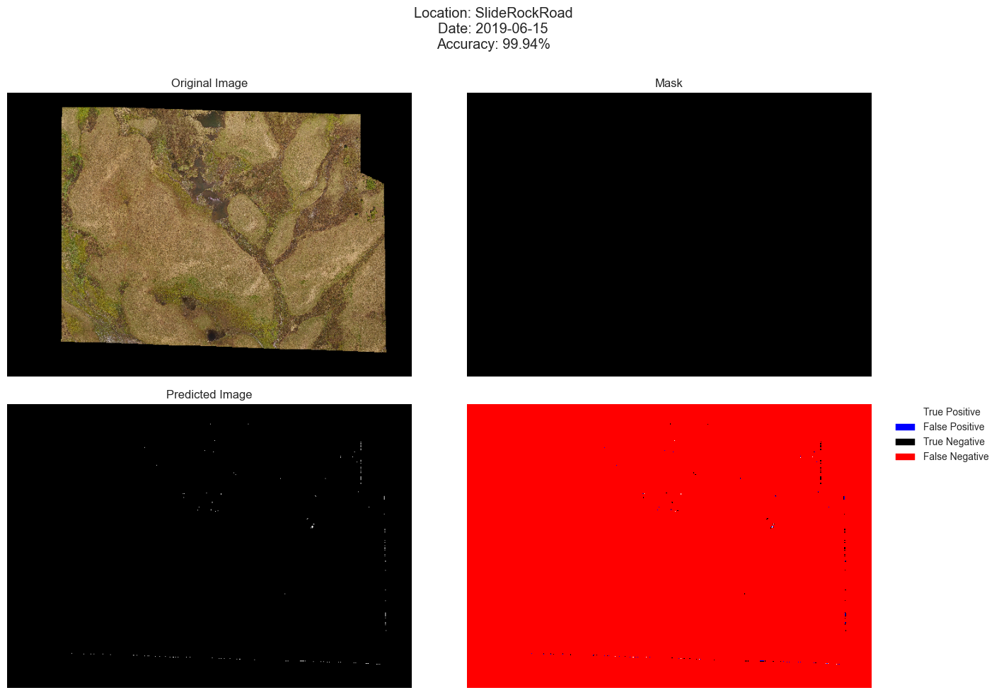

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


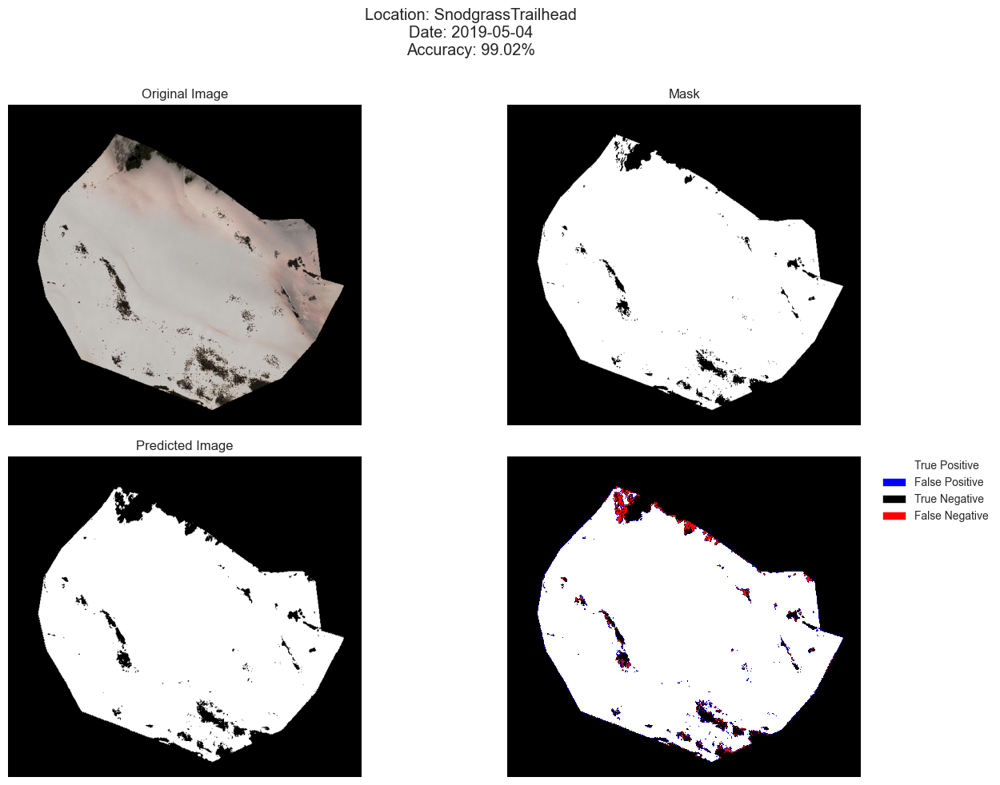

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


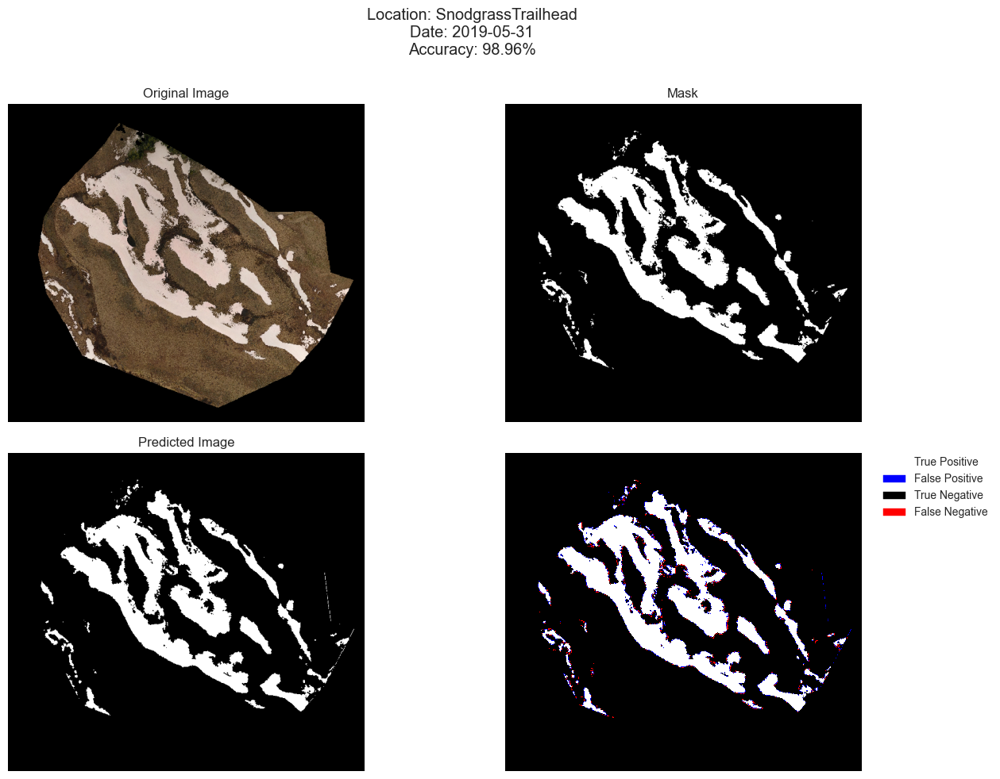

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.0s finished


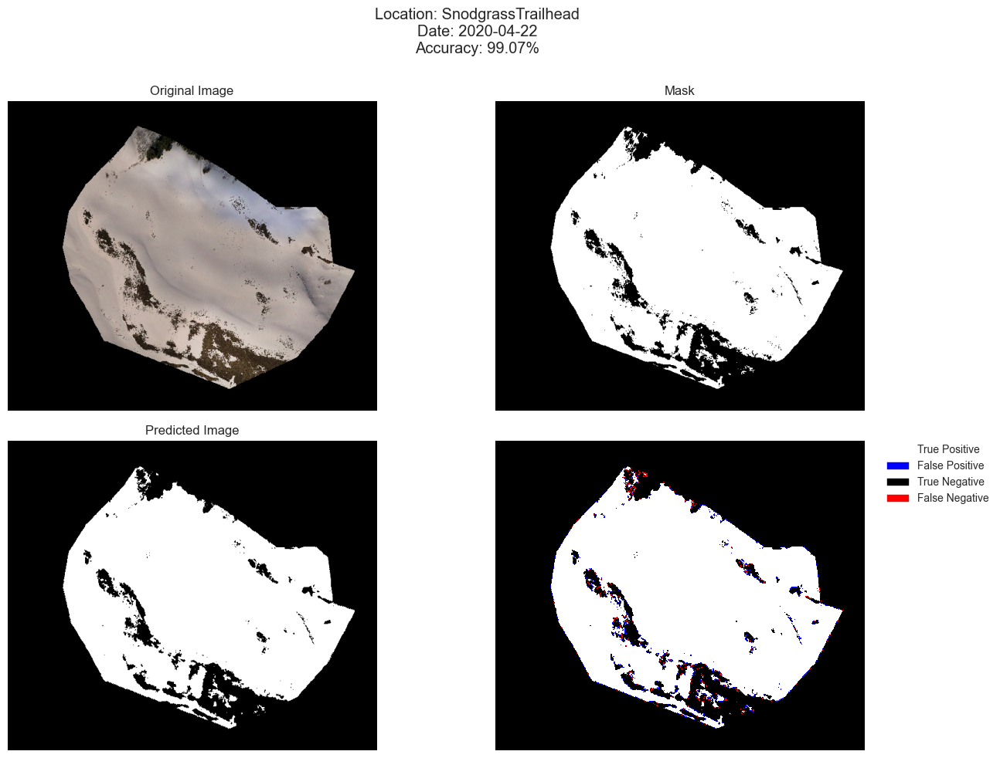

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.0s finished


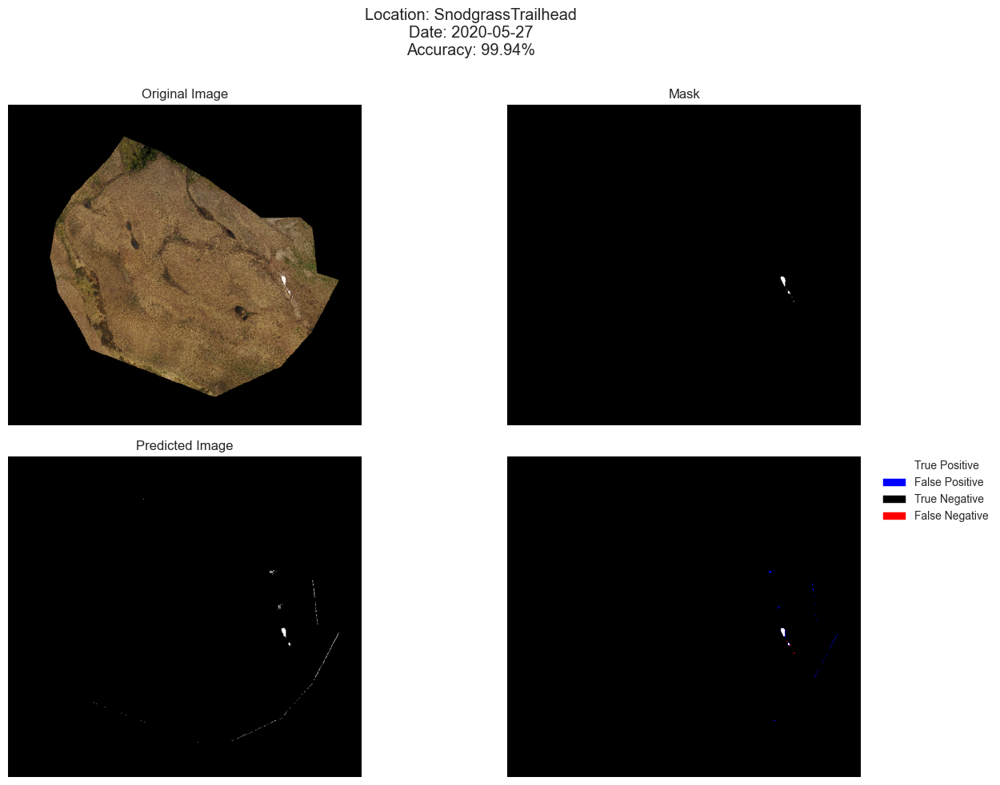

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


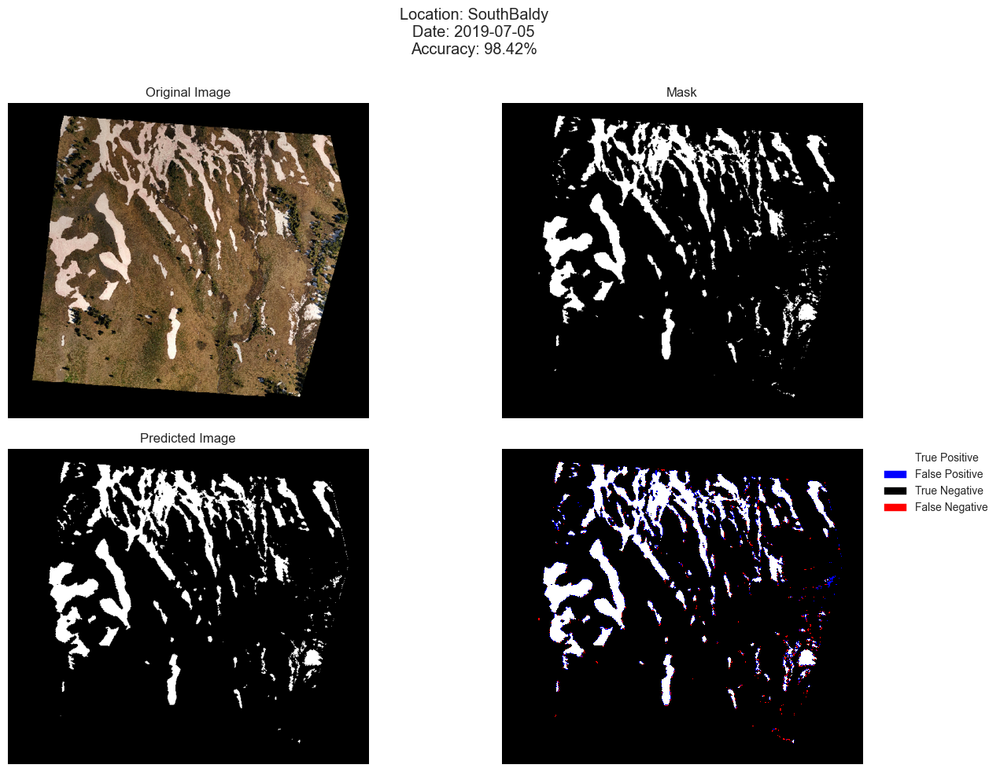

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


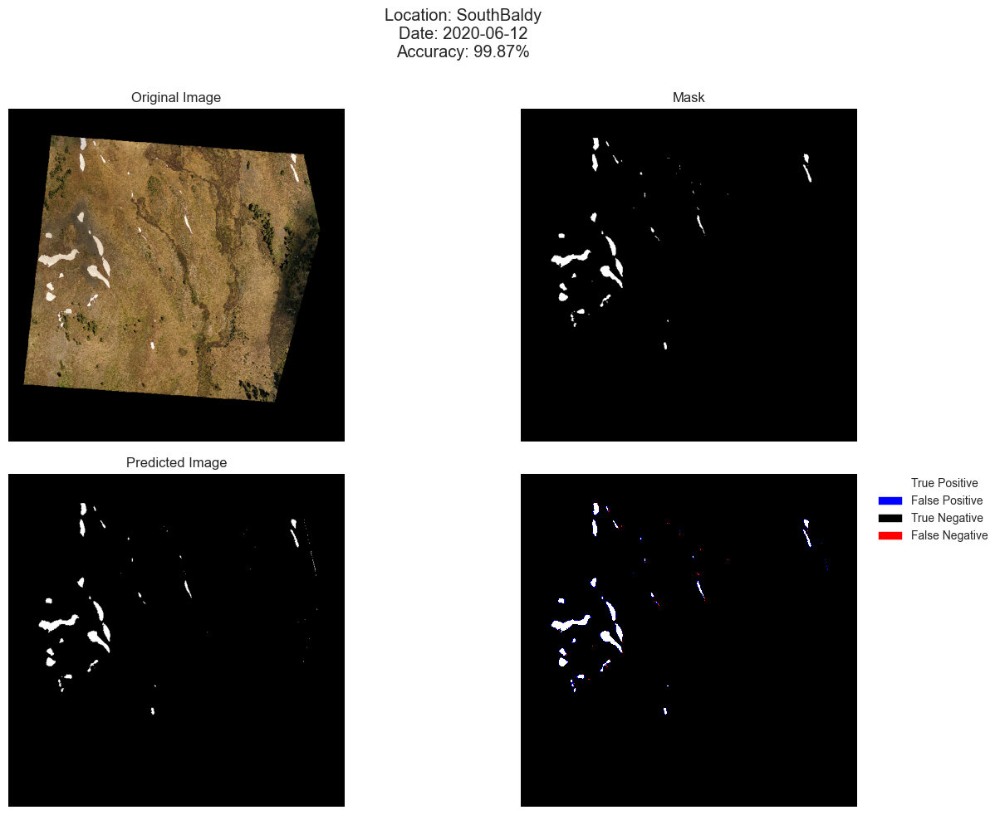

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


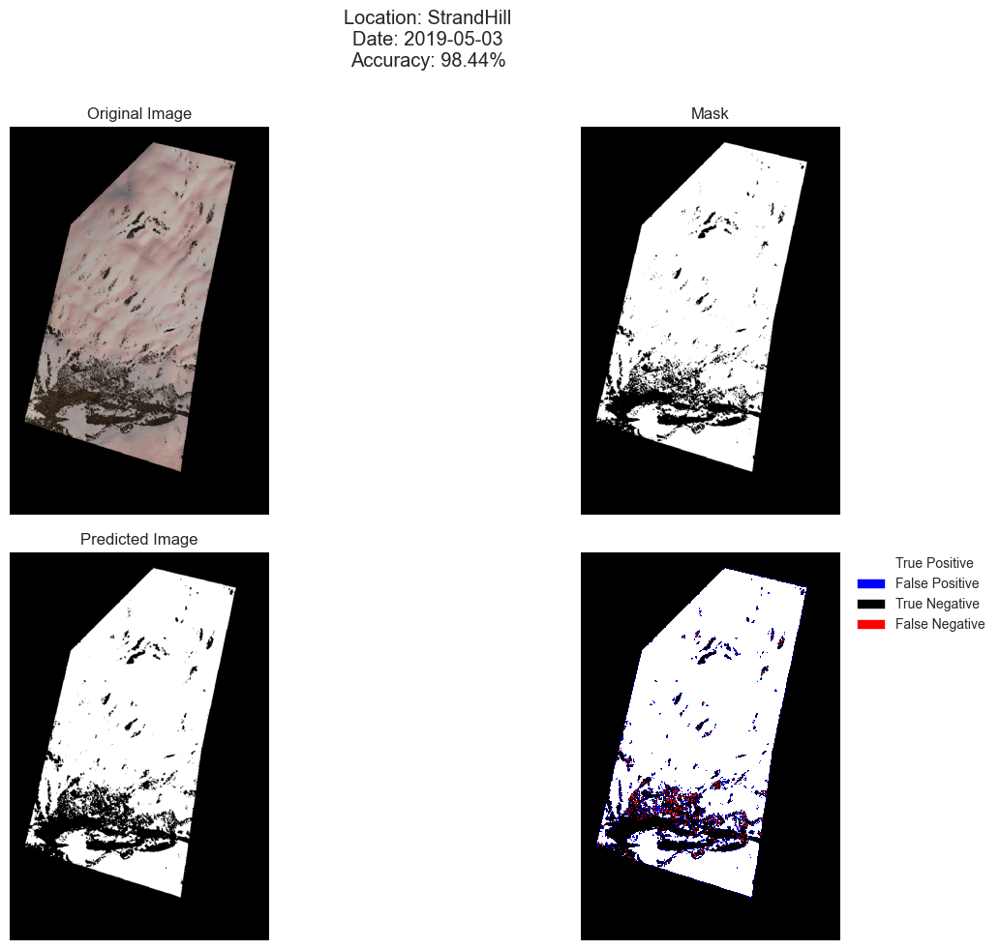

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


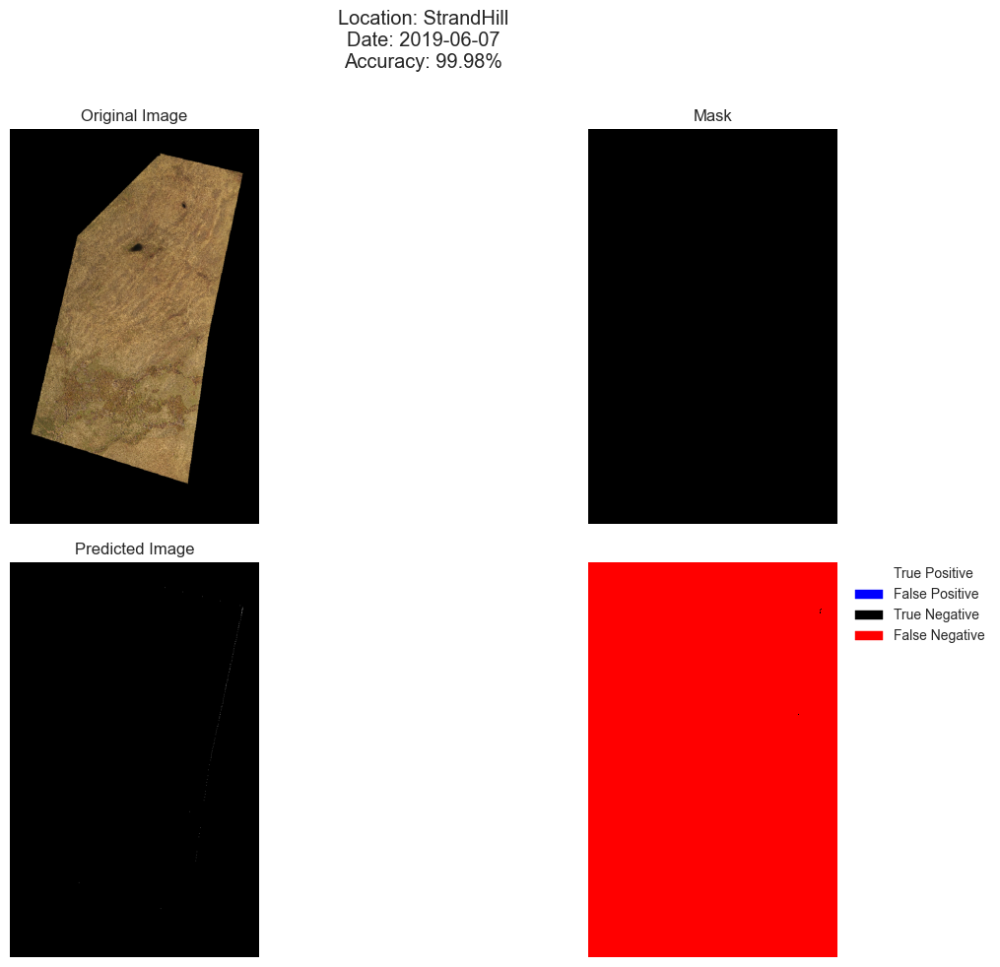

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


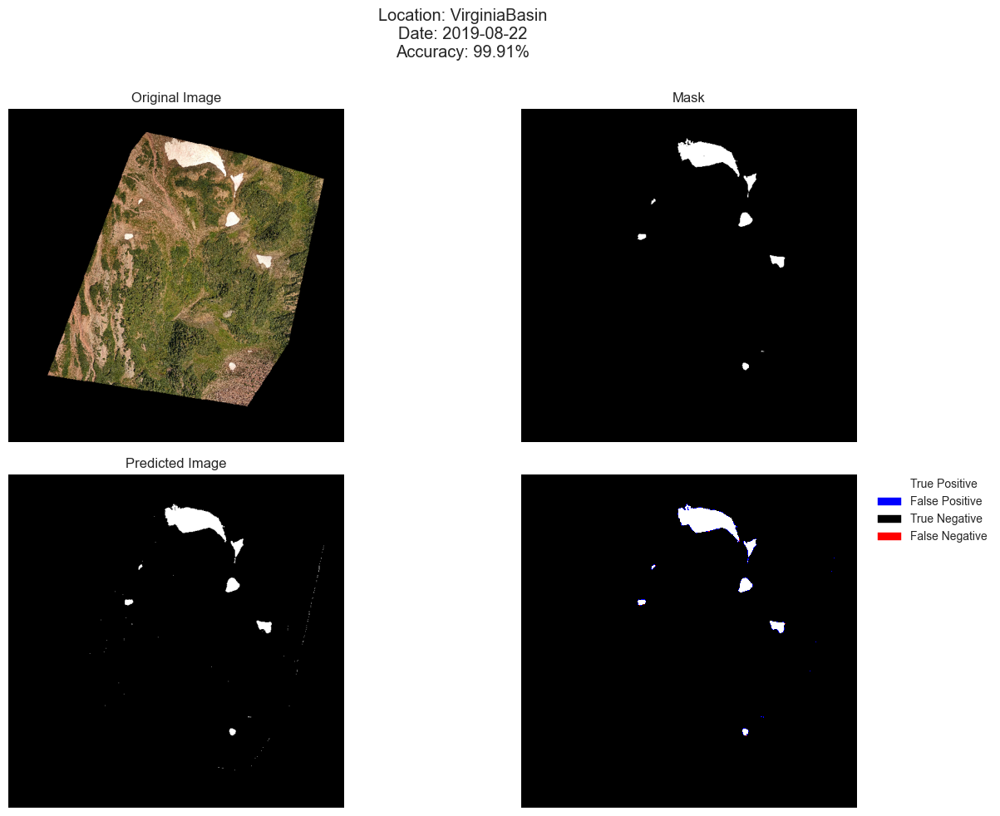

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


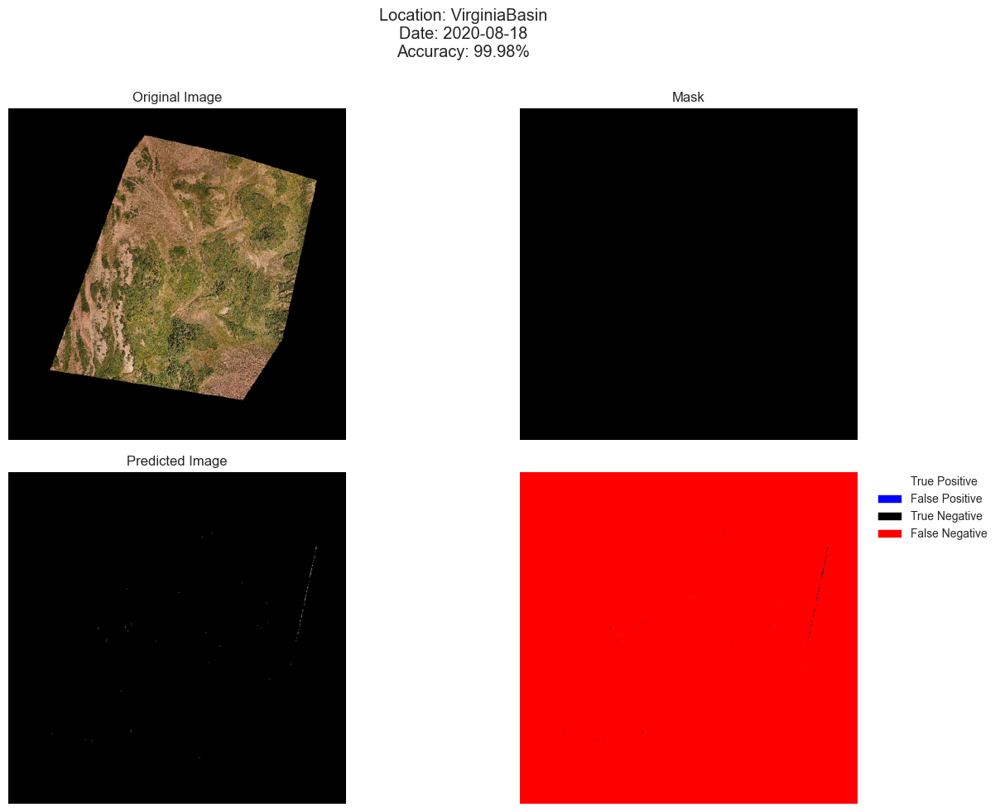

In [18]:
# loop through each image and predict the snow cover
for index, row in csv_df.iterrows():
    # skip 4 out of 5 images
    if index % 5 != 0:
        continue
    snow_path = row['snow_path']
    mask_path = row['snowbinary_path']
    location = row['location']
    date = row['date']

    # create dataframe
    df = image_to_df(snow_path, mask_path, labeled=False, print_gabor=False)

    # load in the original image and mask
    img = cv2.imread(snow_path)
    mask = rasterio.open(mask_path)

    # predict snow cover
    pred = model.predict(df)

    # reshape the prediction to the original image size
    pred_image = pred.reshape((img.shape[0], img.shape[1]))

    # calculate accuracy, confusion matrix
    accuracy = metrics.accuracy_score(mask.read(1).reshape(-1), pred)
    confusion = confusion_matrix(mask.read(1).reshape(-1), pred)

    # visualize the results
    visualize(img, mask, pred_image, location=location, date=date, accuracy=accuracy)

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


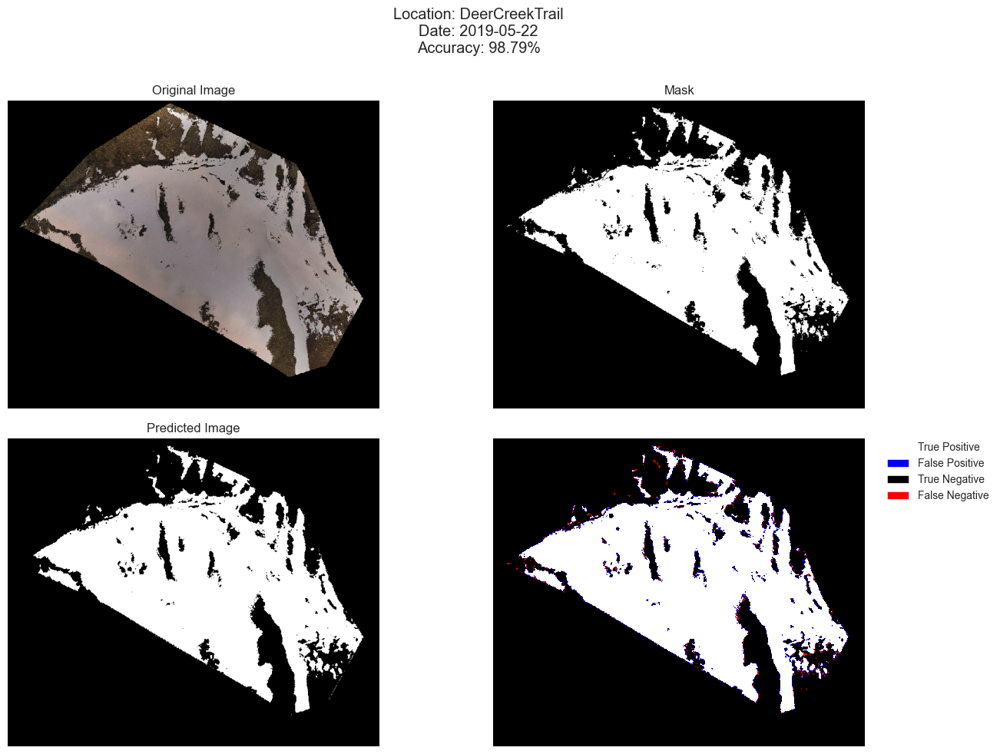

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


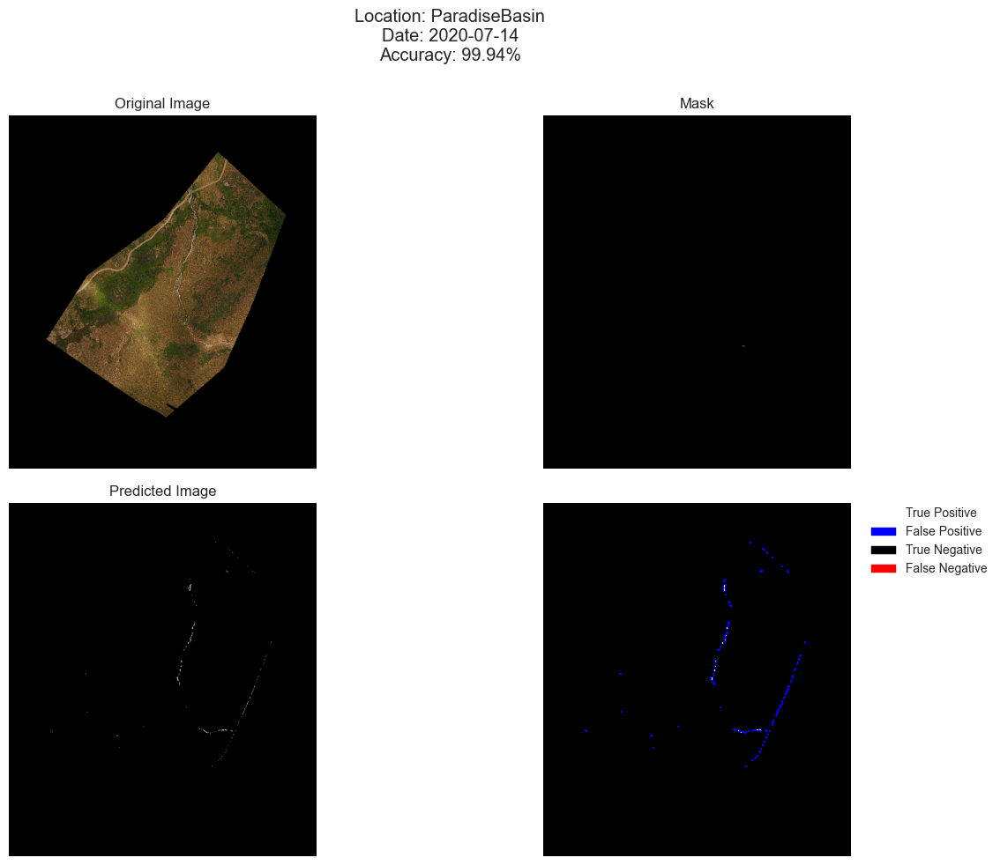

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


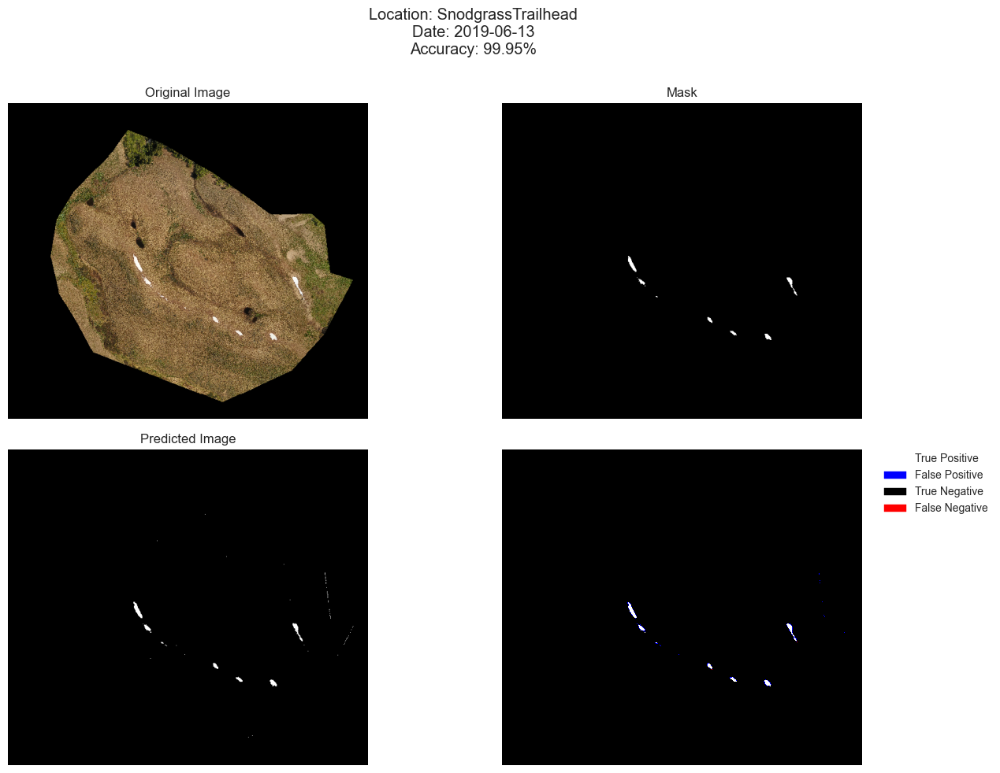

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


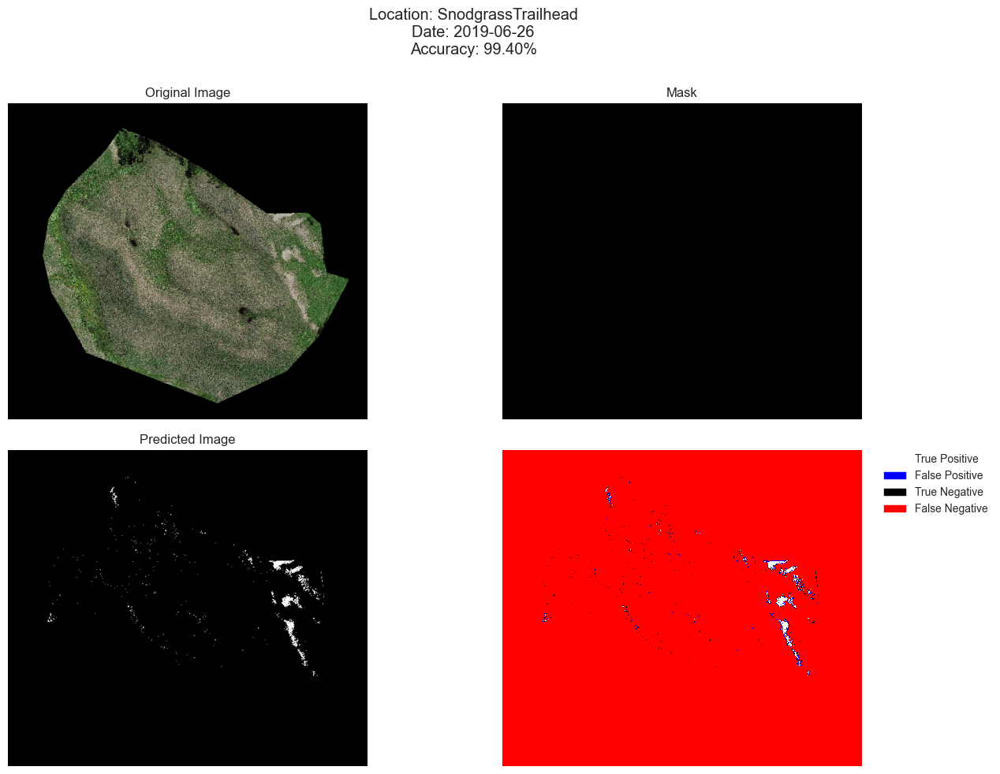

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


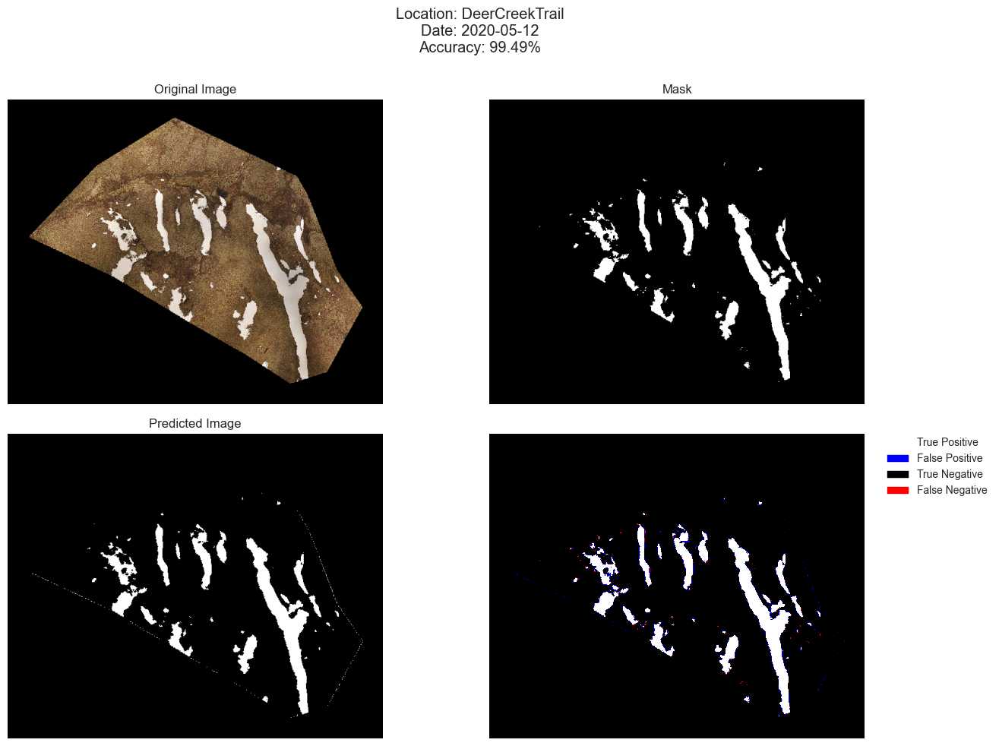

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


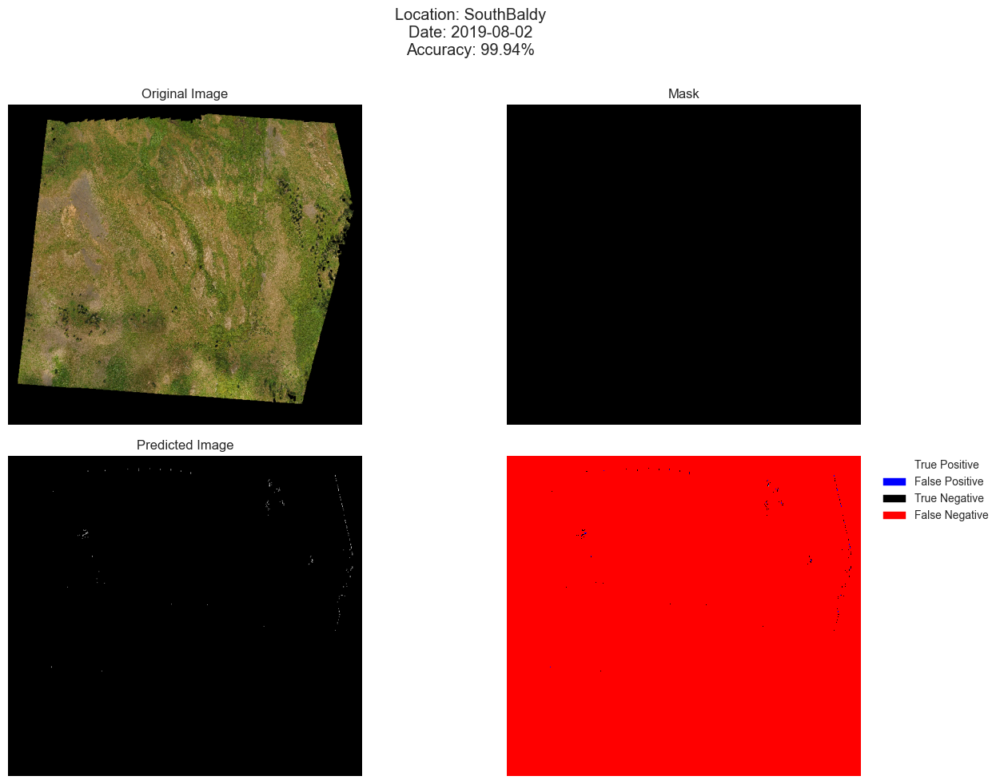

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


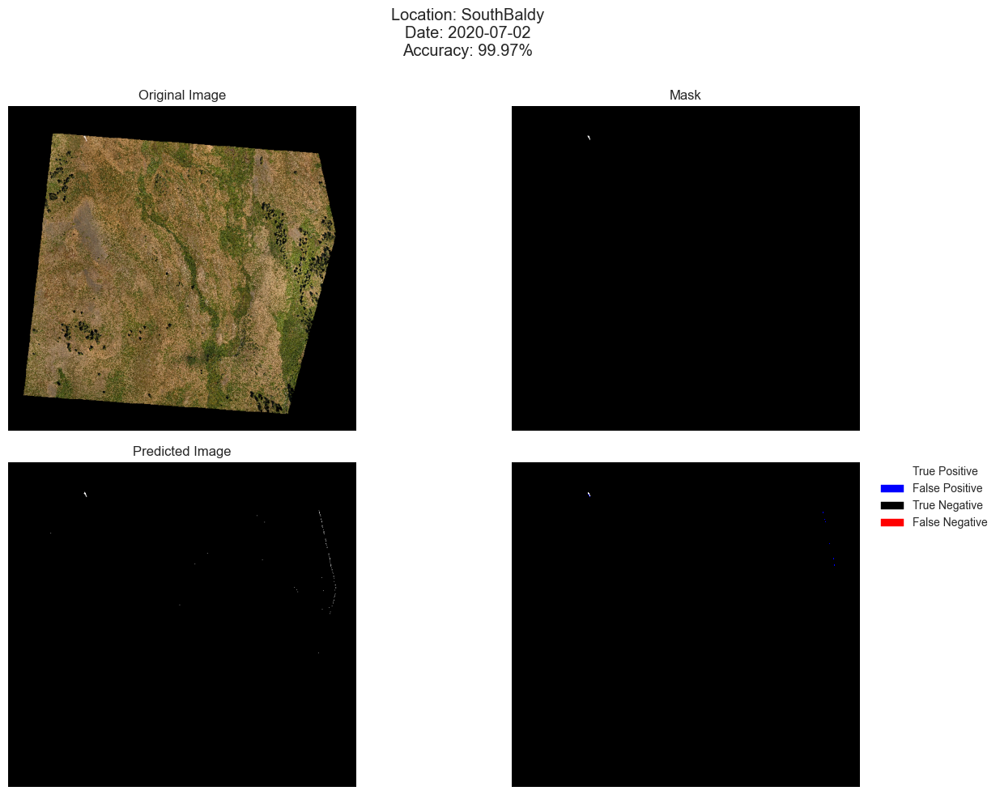

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


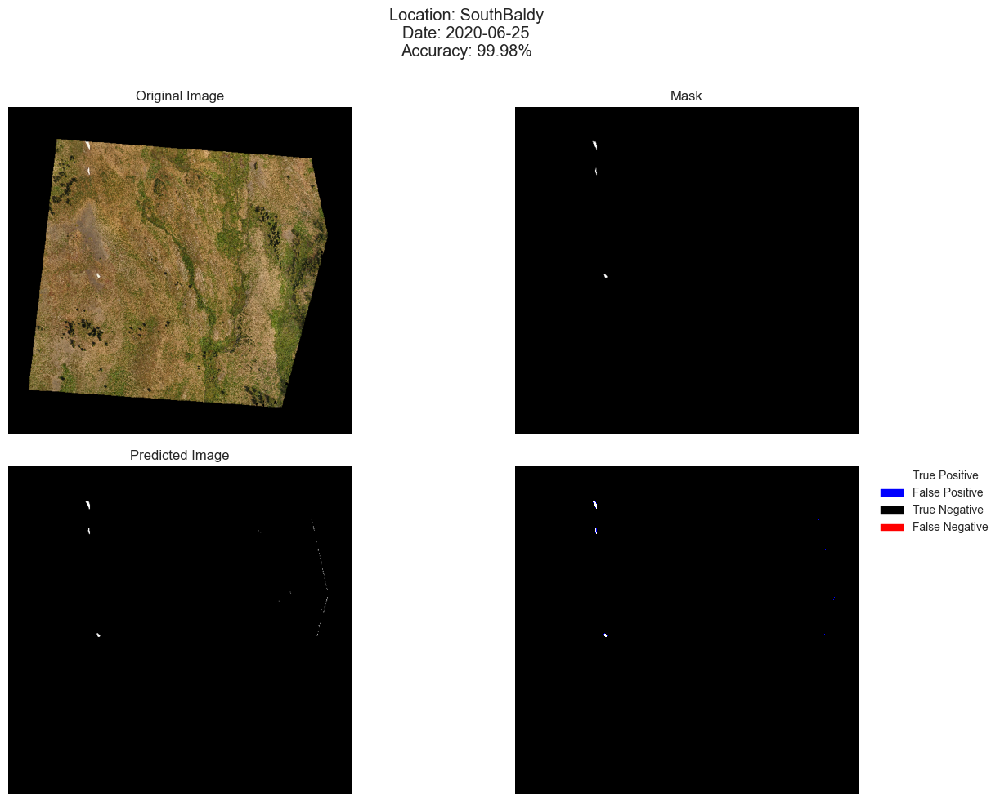

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


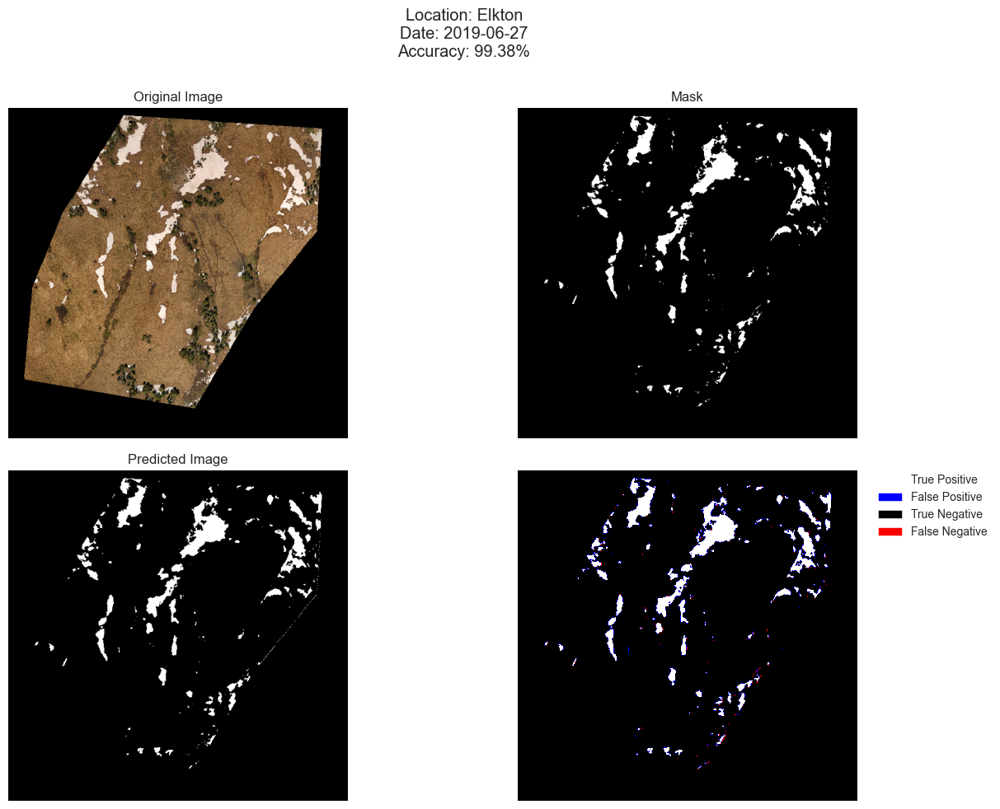

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.0s finished


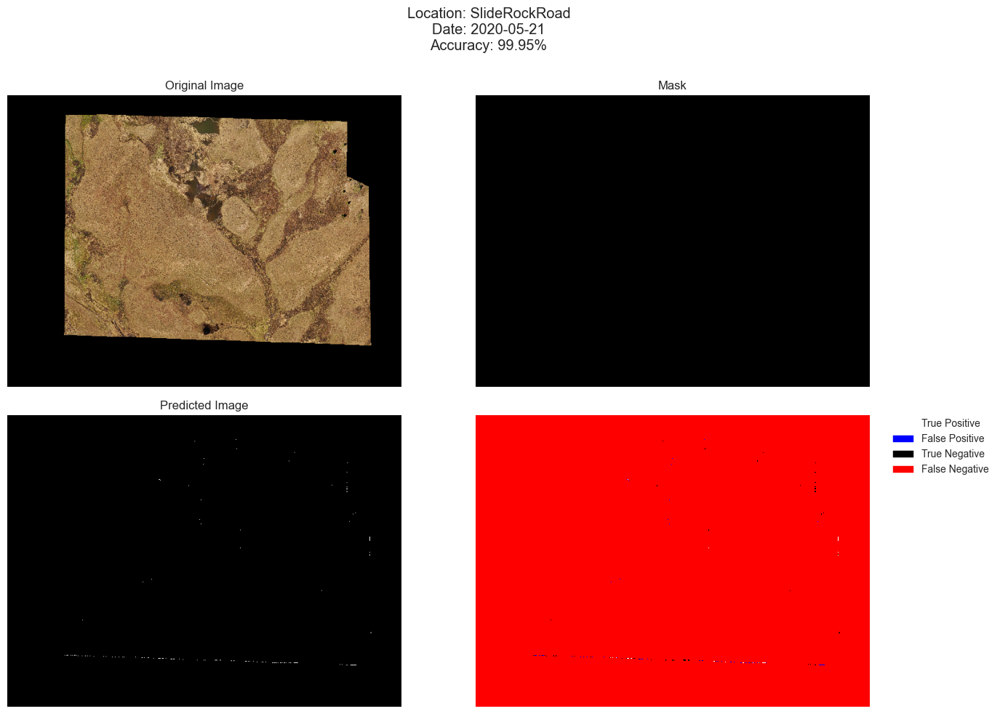

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.0s finished


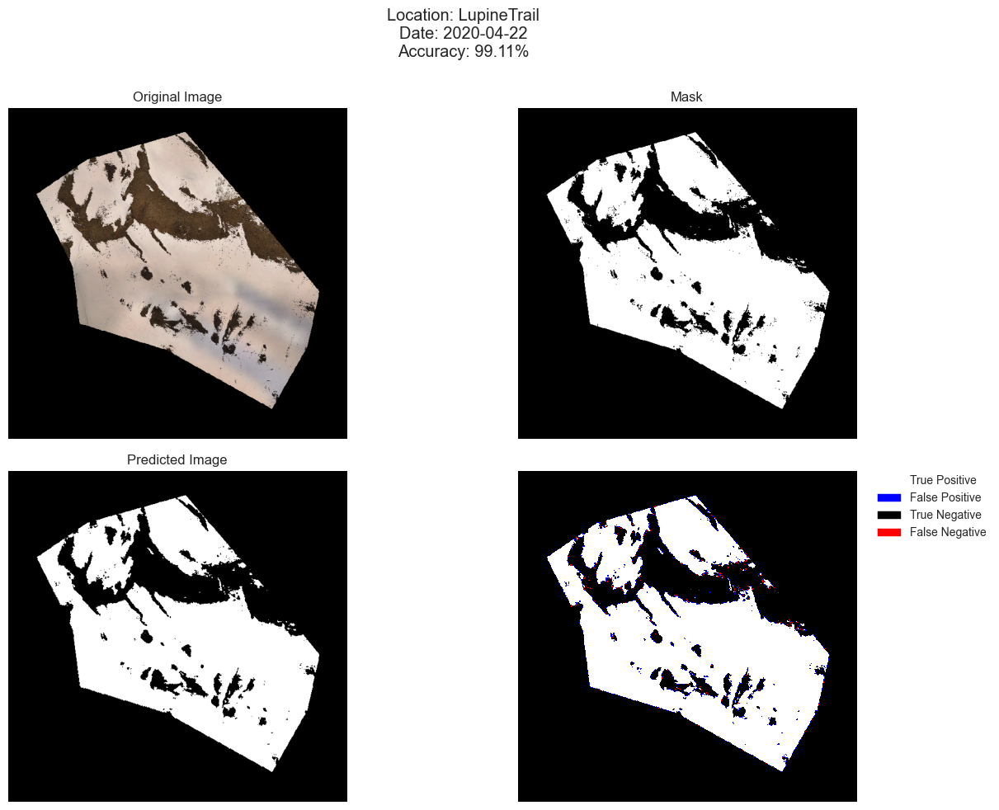

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


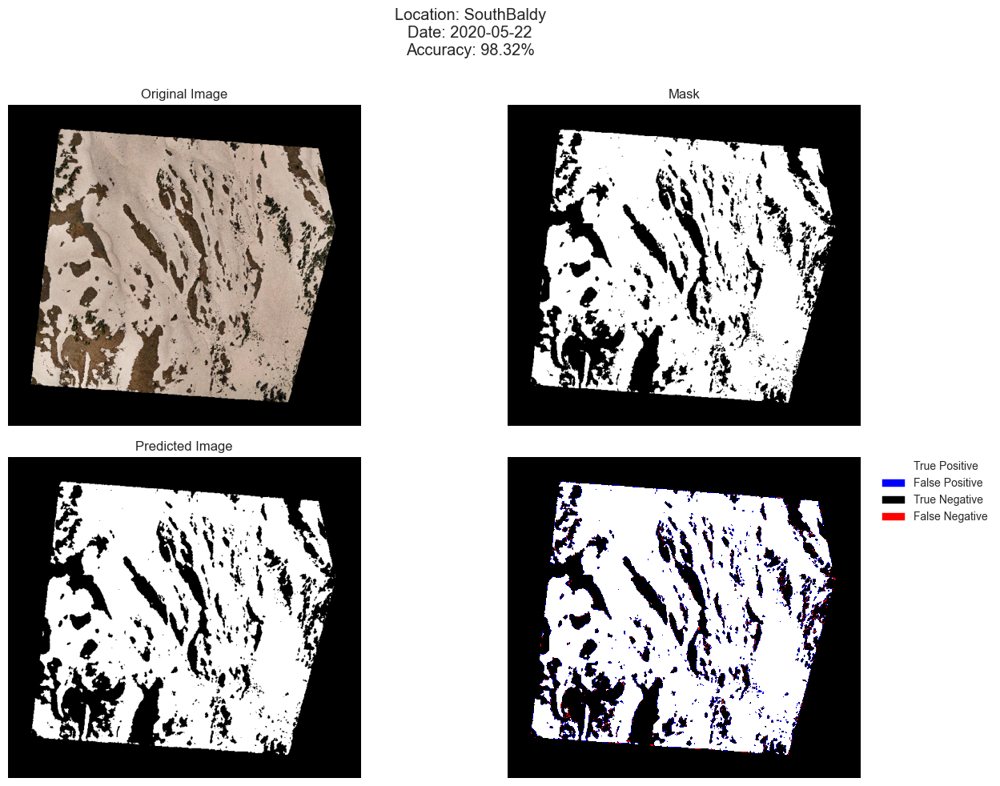

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.1s finished


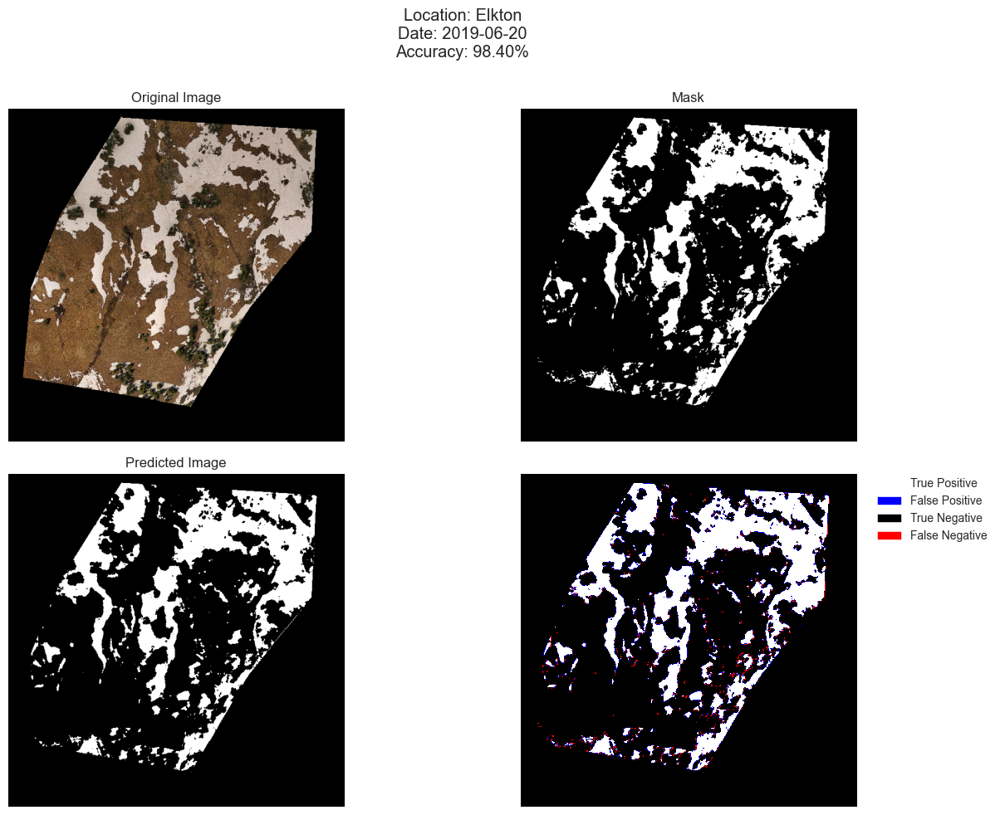

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done  50 out of  50 | elapsed:    0.0s finished


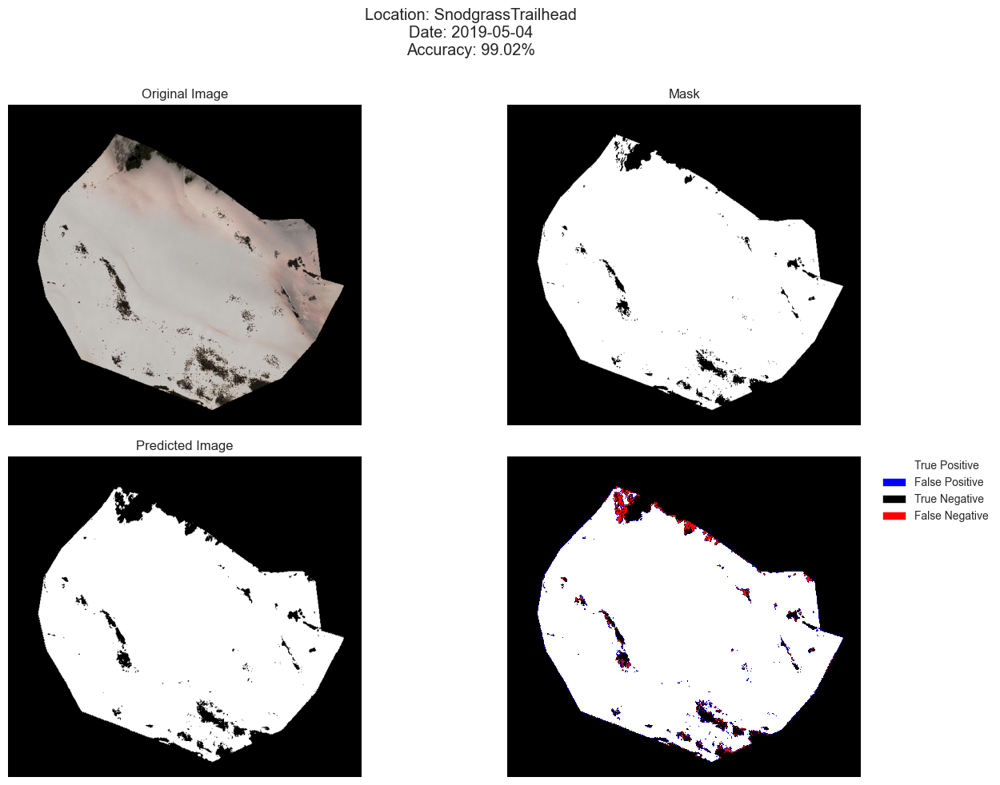

In [5]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, classification_report
# asses metrics on validation images
valid_indexes = [0, 66, 92, 94, 7, 108, 113, 112, 24, 84, 52, 109, 23, 85]

y_true = []
y_pred = []

# loop through
for index in valid_indexes:
    #access csv at index
    row = csv_df.loc[index]

    #get paths
    snow_path = row['snow_path']
    mask_path = row['snowbinary_path']

    #create dataframe
    df = image_to_df(snow_path, mask_path, labeled=False, print_gabor=False)

    #load in the original image and mask
    img = cv2.imread(snow_path)
    mask = rasterio.open(mask_path)

    #predict snow cover
    pred = model.predict(df)

    y_true.append(mask.read(1).reshape(-1))
    y_pred.append(pred)

    #reshape the prediction to the original image size
    pred_image = pred.reshape((img.shape[0], img.shape[1]))

    #calculate accuracy, confusion matrix
    accuracy = metrics.accuracy_score(mask.read(1).reshape(-1), pred)
    confusion = confusion_matrix(mask.read(1).reshape(-1), pred)

    #visualize the results
    visualize(img, mask, pred_image, accuracy=accuracy, location=row['location'], date=row['date'])



In [8]:
y_true = np.concatenate(y_true)
y_pred = np.concatenate(y_pred)

#print overall metrics
print('Overall Metrics')
print(f"Accuracy: {accuracy_score(y_true, y_pred)}")
print(f"Precision: {precision_score(y_true, y_pred)}")
print(f"Recall: {recall_score(y_true, y_pred)}")
print(f"F1 Score: {f1_score(y_true, y_pred)}")
print(classification_report(y_true, y_pred))
conf_mt = confusion_matrix(y_true, y_pred)
print(conf_mt)
conf_mt_sum = conf_mt[0][0] + conf_mt[0][1]+conf_mt[1][0]+conf_mt[1][1]
conf_mt_percent = conf_mt / conf_mt_sum
print(conf_mt_percent)

Overall Metrics
Accuracy: 0.9940309992096303
Precision: 0.9791331236179768
Recall: 0.9742461056007391
F1 Score: 0.976683501371144
              precision    recall  f1-score   support

           0       1.00      1.00      1.00   4587967
           1       0.98      0.97      0.98    675393

    accuracy                           0.99   5263360
   macro avg       0.99      0.99      0.99   5263360
weighted avg       0.99      0.99      0.99   5263360

[[4573944   14023]
 [  17394  657999]]
[[0.86901599 0.00266427]
 [0.00330473 0.12501501]]
